In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, make_scorer
from sklearn.model_selection import train_test_split, GridSearchCV, LeaveOneGroupOut, ParameterGrid
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import optuna

In [ ]:
def plot_clusters(X, y, title):
    plt.figure(figsize=(10, 6))
    palette = sns.color_palette("hsv", len(np.unique(y)))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=y, legend='full', palette=palette, s=60, alpha=0.8)
    plt.title(title)
    plt.show()

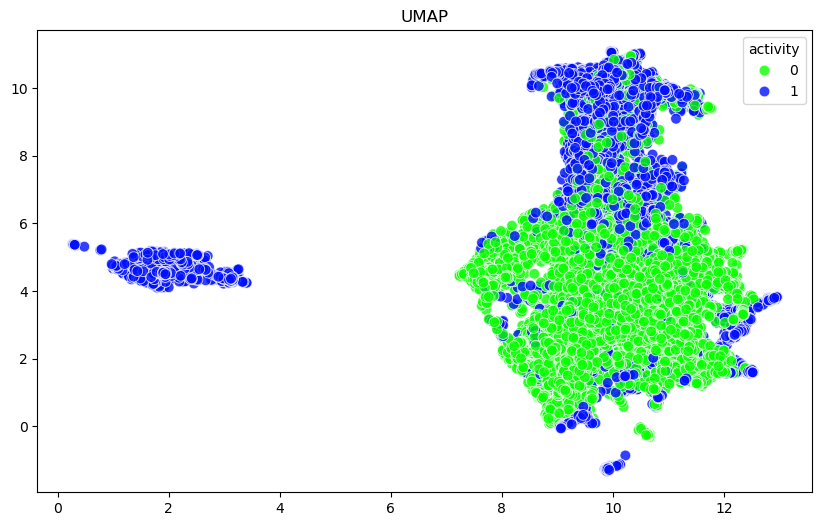

k = 1 tested!
k = 2 tested!
k = 3 tested!
k = 4 tested!
k = 5 tested!
k = 6 tested!
k = 7 tested!
k = 8 tested!
k = 9 tested!
k = 10 tested!
k = 11 tested!
k = 12 tested!
k = 13 tested!
k = 14 tested!
k = 15 tested!
k = 16 tested!
k = 17 tested!
k = 18 tested!
k = 19 tested!
k = 20 tested!
k = 21 tested!
k = 22 tested!
k = 23 tested!
k = 24 tested!
k = 25 tested!
k = 26 tested!
k = 27 tested!
k = 28 tested!
k = 29 tested!
k = 30 tested!
k = 31 tested!
k = 32 tested!
k = 33 tested!
k = 34 tested!
k = 35 tested!
k = 36 tested!
k = 37 tested!
k = 38 tested!
k = 39 tested!
k = 40 tested!
k = 41 tested!
k = 42 tested!
k = 43 tested!
k = 44 tested!
k = 45 tested!
k = 46 tested!
k = 47 tested!
k = 48 tested!
k = 49 tested!
k = 50 tested!
k = 51 tested!
k = 52 tested!
k = 53 tested!
k = 54 tested!
k = 55 tested!
k = 56 tested!
k = 57 tested!
k = 58 tested!
k = 59 tested!
k = 60 tested!
k = 61 tested!
k = 62 tested!
k = 63 tested!
k = 64 tested!
k = 65 tested!
k = 66 tested!
k = 67 tested!
k = 

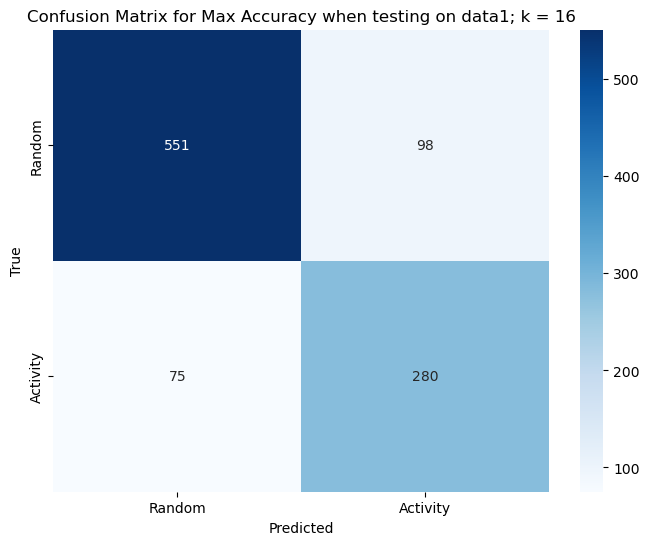

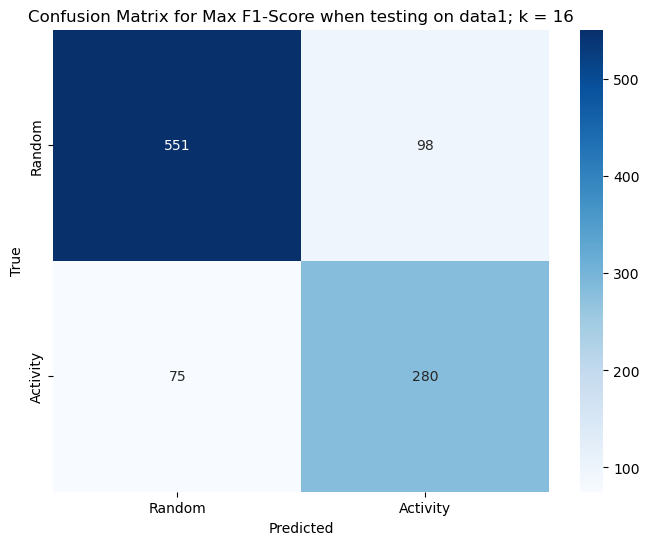

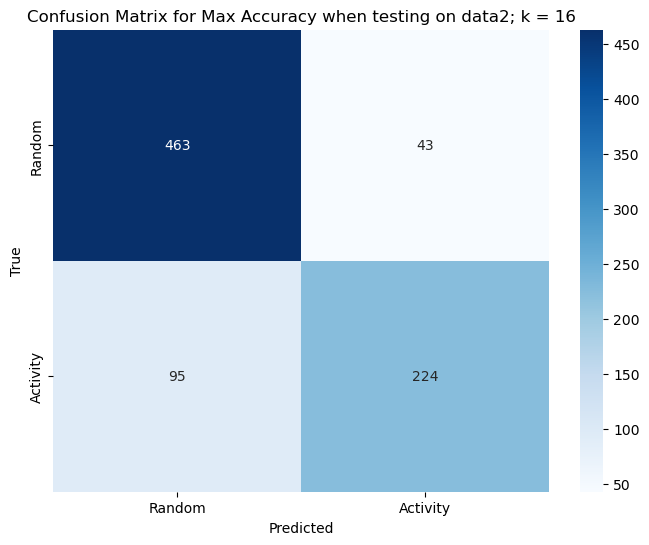

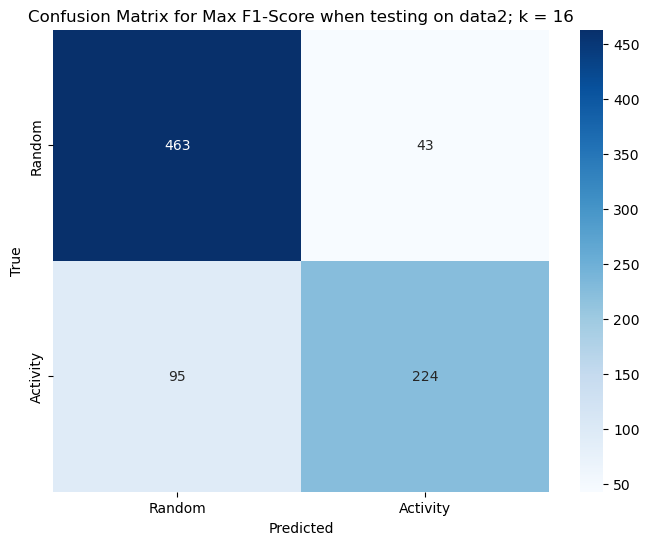

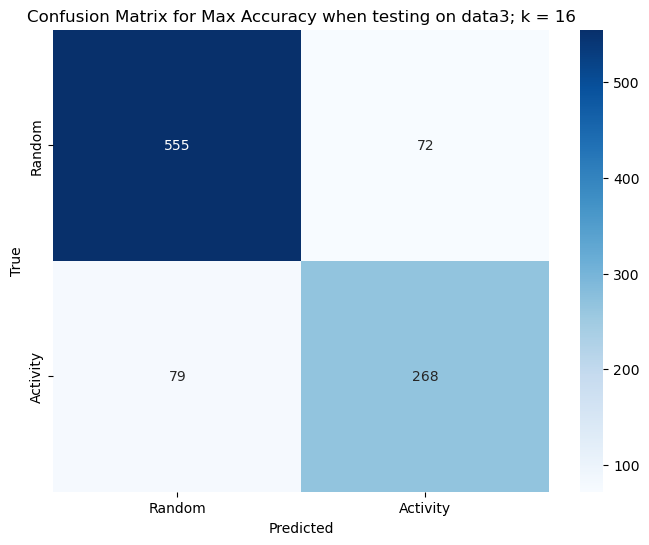

...

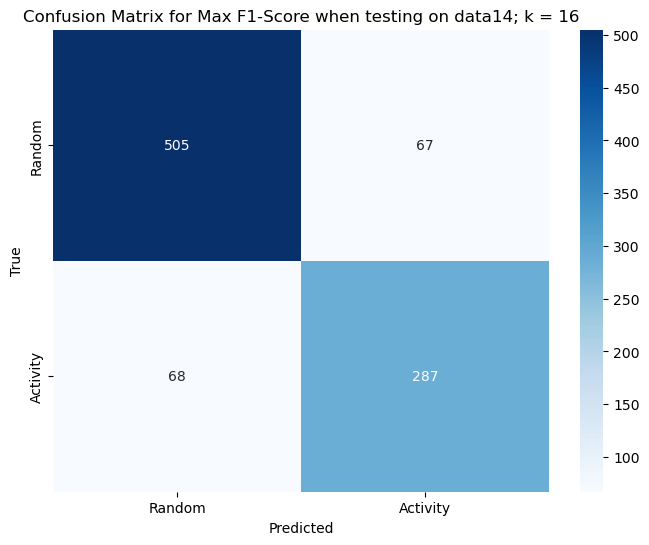

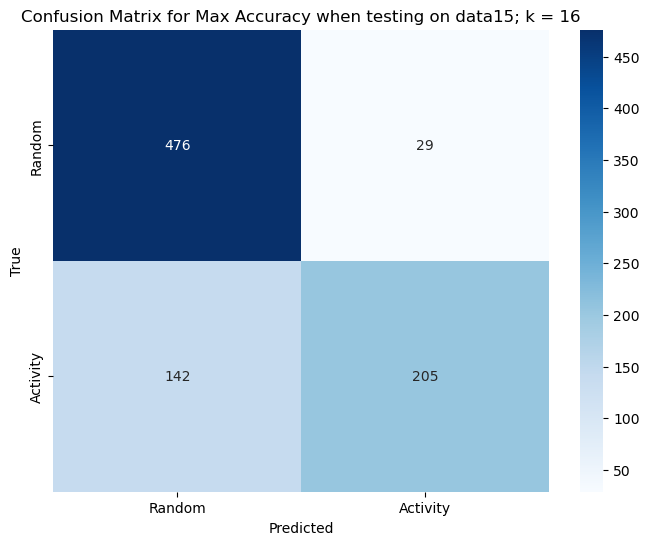

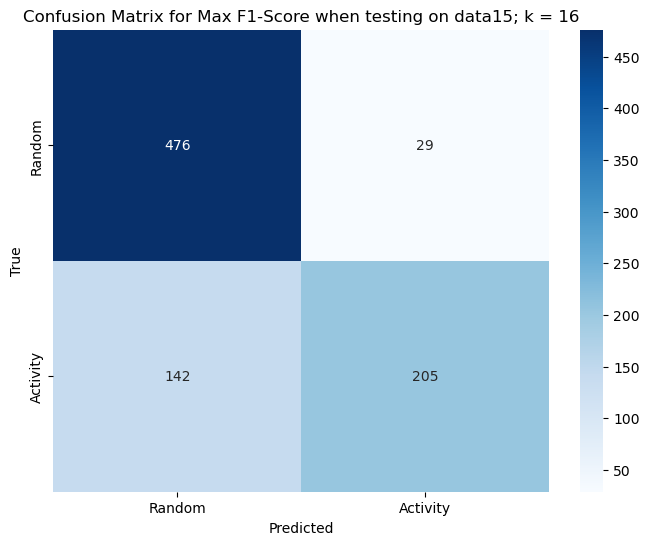

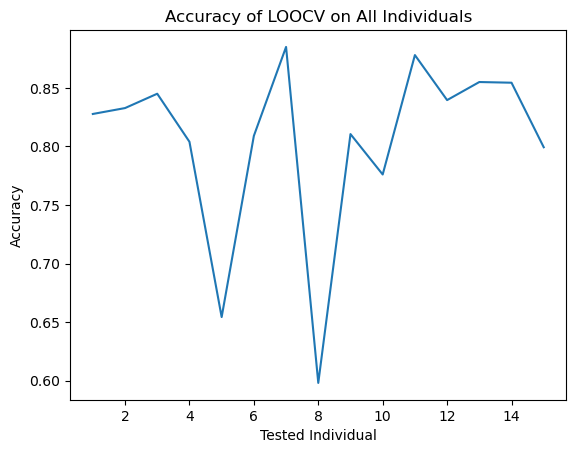

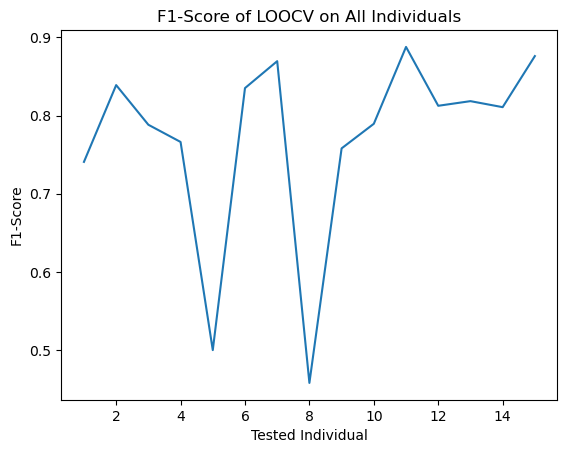

Average Accuracy:  0.8045650300673288
Average F1-Score:  0.7699923729256046


In [ ]:
## ACC_specific_windowed_features.csv
## HR_specific_windowed_features.csv
## BVP_specific_windowed_features.csv
## umap
## 0: baseline, clean baseline, lunch, working, driving
## 1: stairs, soccer, cycling, walking

dataframes = {}
for i in np.arange(1,16):
    name = f"data{i}"
    acc = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/ACC_specific_windowed_features.csv")
    hr = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/HR_specific_windowed_features.csv")
    bvp = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/BVP_specific_windowed_features.csv")
    acc['start_time'] = pd.to_datetime(acc['start_time'])
    hr['start_time'] = pd.to_datetime(hr['start_time'])
    bvp['start_time'] = pd.to_datetime(bvp['start_time'])
    acc['end_time'] = pd.to_datetime(acc['end_time'])
    hr['end_time'] = pd.to_datetime(hr['end_time'])
    bvp['end_time'] = pd.to_datetime(bvp['end_time'])

    common_columns = ['start_time', 'end_time', 'activity']
    data = acc.merge(hr, on=common_columns, how='inner').merge(bvp, on=common_columns, how='inner')
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data = data[~data['activity'].isin([0])]
    data.loc[data['activity'].isin([1, 2, 7, 8, 9]), 'activity'] = 0
    data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 1
    dataframes[name] = data


combined_df = pd.concat(dataframes.values(), ignore_index=True)
numerical_cols = [col for col in combined_df.columns if col != 'activity']
scaled_data = StandardScaler().fit_transform(combined_df[numerical_cols])

umap_reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3)
X_umap = umap_reducer.fit_transform(scaled_data)
tsne_df = pd.DataFrame(data=X_umap, columns=[f'UMAP{i}' for i in np.arange(1, 4)])
tsne_df['activity'] = combined_df['activity']

plot_clusters(X_umap, tsne_df['activity'], "UMAP")

start_idx = 0
for key, df in dataframes.items():
    end_idx = start_idx + len(df)
    dataframes[key] = tsne_df.iloc[start_idx:end_idx].reset_index(drop=True)
    start_idx = end_idx

k_range = np.arange(1, 101)
accuracy = np.zeros(len(np.arange(1,101)))
f1score = np.zeros(len(np.arange(1,101)))
for k in np.arange(1,101):
    fold_accuracy = np.array([])
    fold_f1score = np.array([])

    for tester in dataframes:
        trainingFeatures  = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

        testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
        testingActivity = dataframes[tester]["activity"].to_numpy()

        X_train = pd.DataFrame()
        y_train = pd.DataFrame()
        for trainer in dataframes:
            if trainer != tester:
                X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
                y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

        X_train = X_train.to_numpy()
        y_train = y_train.to_numpy().flatten()

        testingFeatures = StandardScaler().fit_transform(testingFeatures)
        X_train = StandardScaler().fit_transform(X_train)

        knn = KNeighborsClassifier(k)
        knn.fit(X_train, y_train)

        y_pred = knn.predict(testingFeatures)

        fold_accuracy = np.append(fold_accuracy, accuracy_score(testingActivity, y_pred))
        fold_f1score = np.append(fold_f1score, precision_score(testingActivity, y_pred))

    accuracy[i] = fold_accuracy.mean()
    f1score[i] = fold_f1score.mean()

    print(f"k = {k} tested!")

best_k_acc = k_range[np.argmax(accuracy)]
best_k_f1 = k_range[np.argmax(f1score)]

LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])

for tester in dataframes:
    trainingFeatures = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)

    knn = KNeighborsClassifier(best_k_acc)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Random", "Activity"]

    # Plot confusion matrix for accuracy
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; k = {best_k_acc}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))

    knn = KNeighborsClassifier(best_k_f1)
    knn.fit(X_train, y_train)

    y_pred = knn.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Random", "Activity"]

    # Plot confusion matrix for F1-Score
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {best_k_f1}")
    plt.show()

    LOOCVf1_score = np.append(LOOCVf1_score, precision_score(testingActivity, y_pred))

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("F1-Score of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("F1-Score")
plt.show()

print("Average Accuracy: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print("Average F1-Score: ", sum(LOOCVf1_score) / len(LOOCVf1_score))


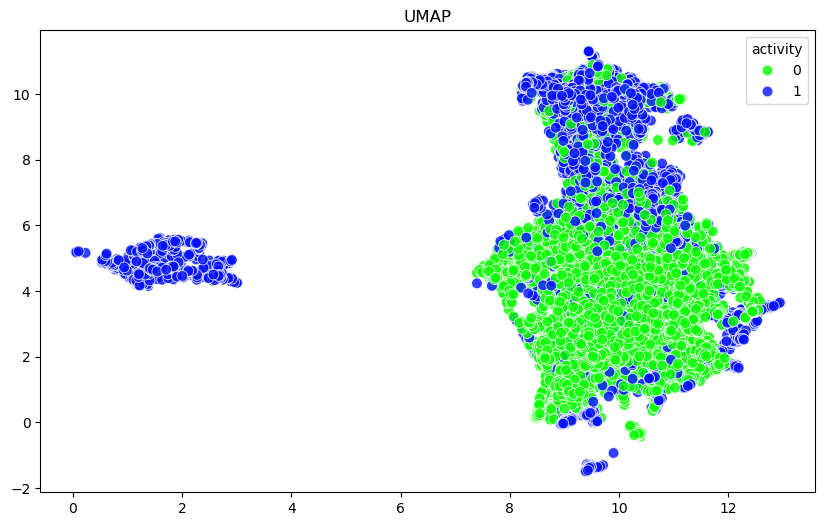

C = 0.001 and gamma = 0.001 tested!
C = 0.001 and gamma = 0.01 tested!
C = 0.001 and gamma = 0.1 tested!
C = 0.001 and gamma = 1.0 tested!
C = 0.001 and gamma = 10.0 tested!
C = 0.001 and gamma = 100.0 tested!
C = 0.001 and gamma = scale tested!
C = 0.01 and gamma = 0.001 tested!
C = 0.01 and gamma = 0.01 tested!
C = 0.01 and gamma = 0.1 tested!
C = 0.01 and gamma = 1.0 tested!
C = 0.01 and gamma = 10.0 tested!
C = 0.01 and gamma = 100.0 tested!
C = 0.01 and gamma = scale tested!
C = 0.1 and gamma = 0.001 tested!
C = 0.1 and gamma = 0.01 tested!
C = 0.1 and gamma = 0.1 tested!
C = 0.1 and gamma = 1.0 tested!
C = 0.1 and gamma = 10.0 tested!
C = 0.1 and gamma = 100.0 tested!
C = 0.1 and gamma = scale tested!
C = 1.0 and gamma = 0.001 tested!
C = 1.0 and gamma = 0.01 tested!
C = 1.0 and gamma = 0.1 tested!
C = 1.0 and gamma = 1.0 tested!
C = 1.0 and gamma = 10.0 tested!
C = 1.0 and gamma = 100.0 tested!
C = 1.0 and gamma = scale tested!
C = 10.0 and gamma = 0.001 tested!
C = 10.0 and gam

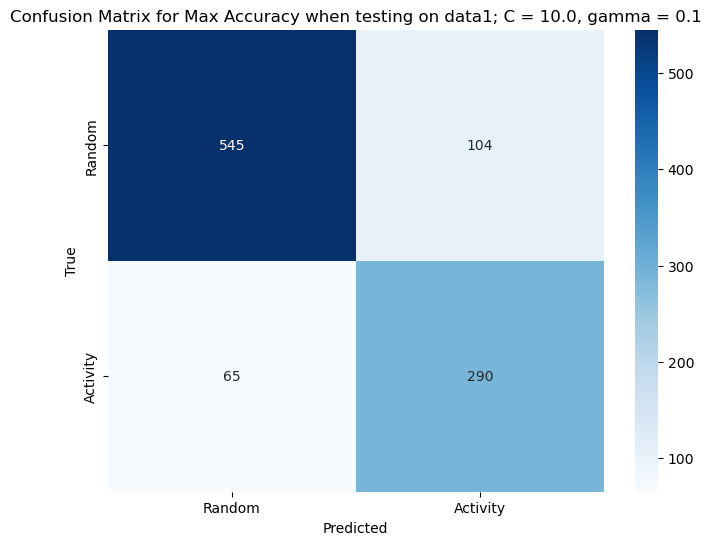

NameError: name 'best_k_f1' is not defined

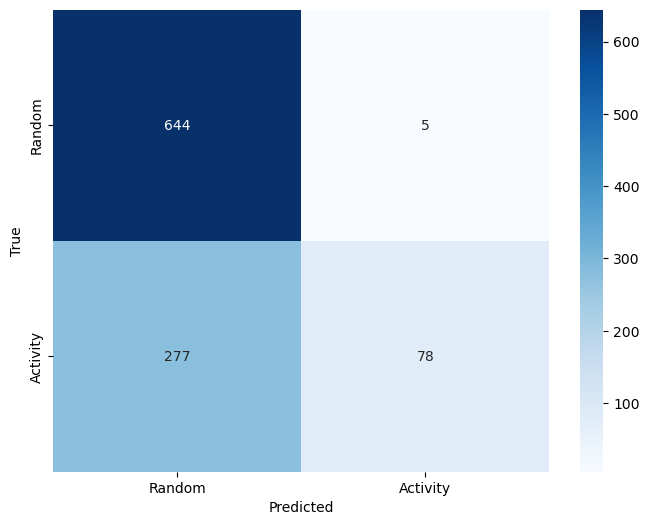

In [ ]:
## ACC_specific_windowed_features.csv
## HR_specific_windowed_features.csv
## BVP_specific_windowed_features.csv
## umap
## 0: baseline, clean baseline, lunch, working, driving
## 1: stairs, soccer, cycling, walking

dataframes = {}
for i in np.arange(1,16):
    name = f"data{i}"
    acc = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/ACC_specific_windowed_features.csv")
    hr = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/HR_specific_windowed_features.csv")
    bvp = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/BVP_specific_windowed_features.csv")
    acc['start_time'] = pd.to_datetime(acc['start_time'])
    hr['start_time'] = pd.to_datetime(hr['start_time'])
    bvp['start_time'] = pd.to_datetime(bvp['start_time'])
    acc['end_time'] = pd.to_datetime(acc['end_time'])
    hr['end_time'] = pd.to_datetime(hr['end_time'])
    bvp['end_time'] = pd.to_datetime(bvp['end_time'])

    common_columns = ['start_time', 'end_time', 'activity']
    data = acc.merge(hr, on=common_columns, how='inner').merge(bvp, on=common_columns, how='inner')
    allFeatures  = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data = data[~data['activity'].isin([0])]
    data.loc[data['activity'].isin([1, 2, 7, 8, 9]), 'activity'] = 0
    data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 1
    dataframes[name] = data


combined_df = pd.concat(dataframes.values(), ignore_index=True)
numerical_cols = [col for col in combined_df.columns if col != 'activity']
scaled_data = StandardScaler().fit_transform(combined_df[numerical_cols])

umap_reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3)
X_umap = umap_reducer.fit_transform(scaled_data)
tsne_df = pd.DataFrame(data=X_umap, columns=[f'UMAP{i}' for i in np.arange(1, 4)])
tsne_df['activity'] = combined_df['activity']

plot_clusters(X_umap, tsne_df['activity'], "UMAP")

start_idx = 0
for key, df in dataframes.items():
    end_idx = start_idx + len(df)
    dataframes[key] = tsne_df.iloc[start_idx:end_idx].reset_index(drop=True)
    start_idx = end_idx

C_range = np.logspace(-3, 2, 6)
gamma_range = np.logspace(-3, 2, 6).tolist() + ["scale"]
param_grid = [(C, gamma) for C in C_range for gamma in gamma_range]

accuracy = np.zeros(len(param_grid))
f1score = np.zeros(len(param_grid))

# Perform grid search
for idx, (C, gamma) in enumerate(param_grid):
    fold_accuracy = np.array([])
    fold_f1score = np.array([])

    for tester in dataframes:
        trainingFeatures = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

        testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
        testingActivity = dataframes[tester]["activity"].to_numpy()

        X_train = pd.DataFrame()
        y_train = pd.DataFrame()
        for trainer in dataframes:
            if trainer != tester:
                X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
                y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

        X_train = X_train.to_numpy()
        y_train = y_train.to_numpy().flatten()

        testingFeatures = StandardScaler().fit_transform(testingFeatures)
        X_train = StandardScaler().fit_transform(X_train)

        svm = SVC(C=C, gamma=gamma)
        svm.fit(X_train, y_train)

        y_pred = svm.predict(testingFeatures)
        fold_accuracy = np.append(fold_accuracy, accuracy_score(testingActivity, y_pred))
        fold_f1score = np.append(fold_f1score, precision_score(testingActivity, y_pred, zero_division=0))

    accuracy[idx] = fold_accuracy.mean()
    f1score[idx] = fold_f1score.mean()
    print(f"C = {C} and gamma = {gamma} tested!")

best_C_acc, best_gamma_acc = param_grid[np.argmax(accuracy)]
best_C_f1, best_gamma_f1 = param_grid[np.argmax(f1score)]

print(f"Best C for accuracy: {best_C_acc}, Best gamma for accuracy: {best_gamma_acc}")
print(f"Best C for F1-Score: {best_C_f1}, Best gamma for F1-Score: {best_gamma_f1}")


# Evaluate with best C and gamma for accuracy and F1-Score
LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])

for tester in dataframes:
    trainingFeatures = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)

    # Using best C and gamma for accuracy
    svm = SVC(kernel='rbf', C=best_C_acc, gamma=best_gamma_acc)
    svm.fit(X_train, y_train)

    y_pred = svm.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred)
    labels = ["Random", "Activity"]

    # Plot confusion matrix for accuracy
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; C = {best_C_acc}, gamma = {best_gamma_acc}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))

    # Using best C and gamma for F1-Score
    svm = SVC(kernel='rbf', C=best_C_f1, gamma=best_gamma_f1)
    svm.fit(X_train, y_train)

    y_pred = svm.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Random", "Activity"]

    # Plot confusion matrix for F1-Score
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; k = {best_k_f1}")
    plt.show()

    LOOCVf1_score = np.append(LOOCVf1_score, precision_score(testingActivity, y_pred, zero_division=0))

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("F1-Score of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("F1-Score")
plt.show()

print("Average Accuracy: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print("Average F1-Score: ", sum(LOOCVf1_score) / len(LOOCVf1_score))

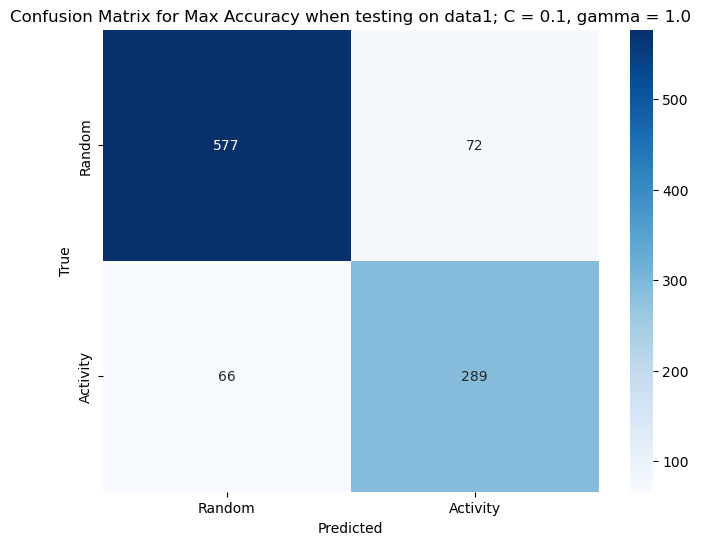

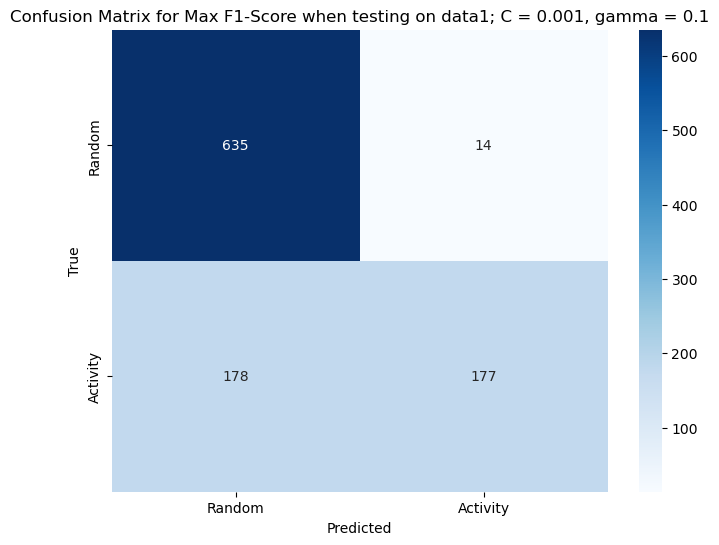

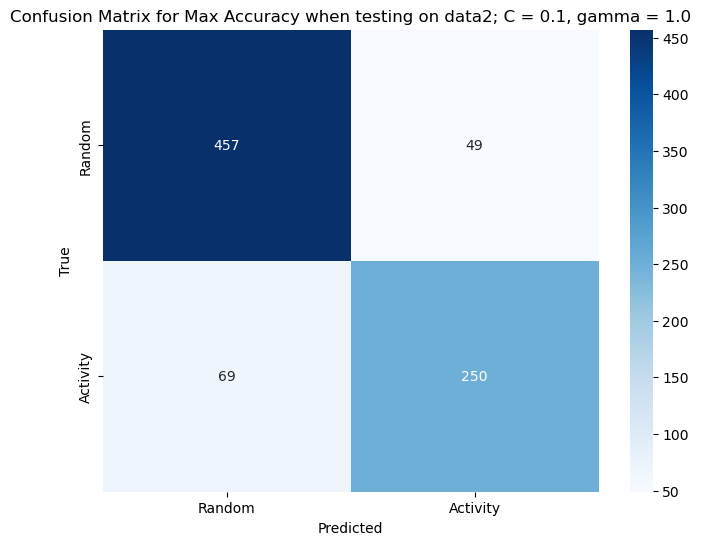

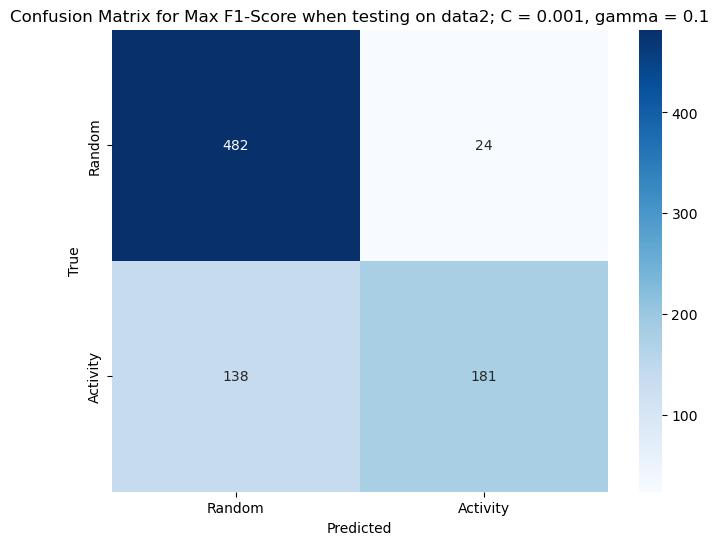

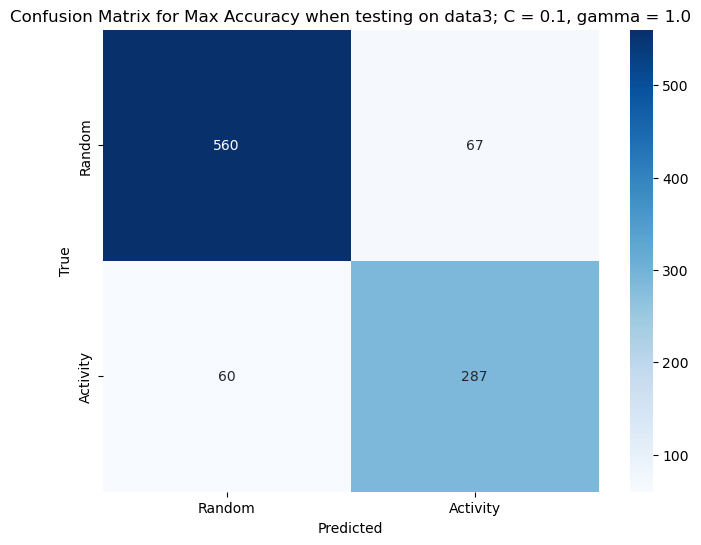

...

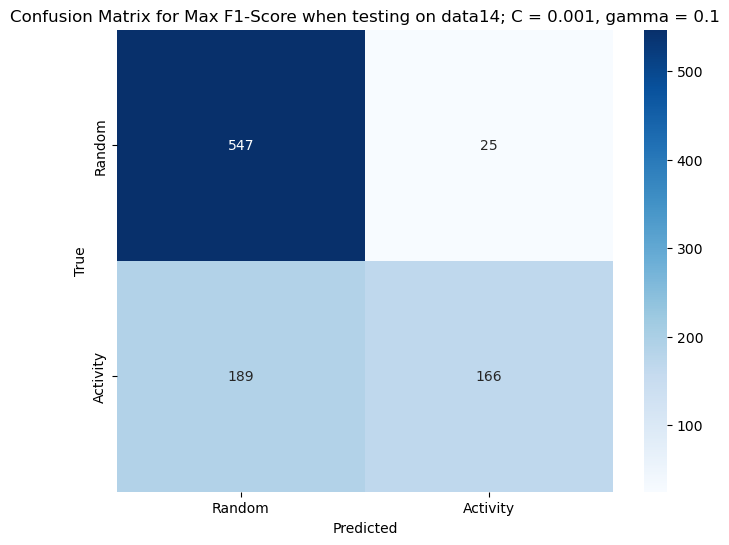

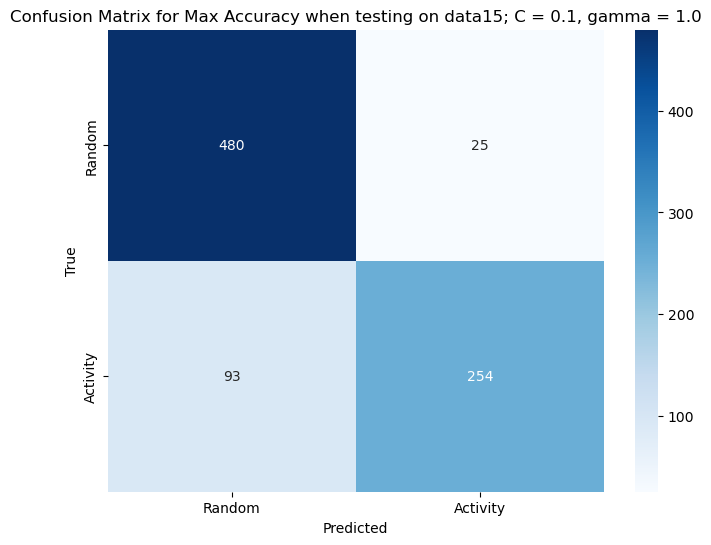

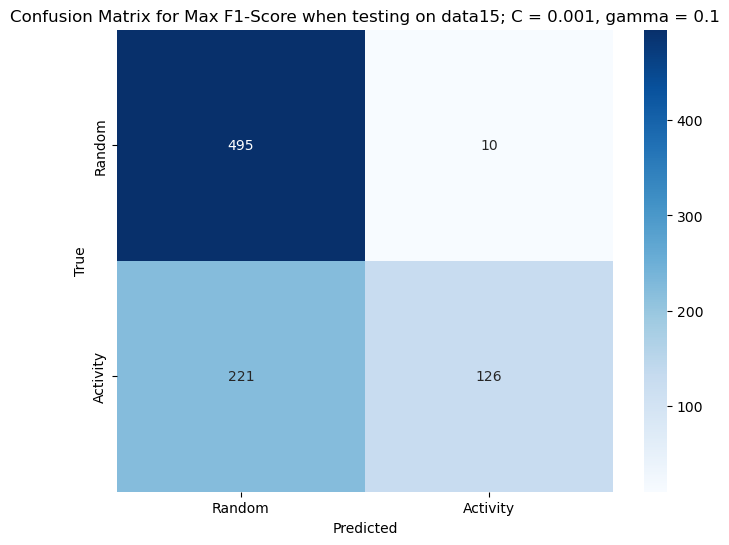

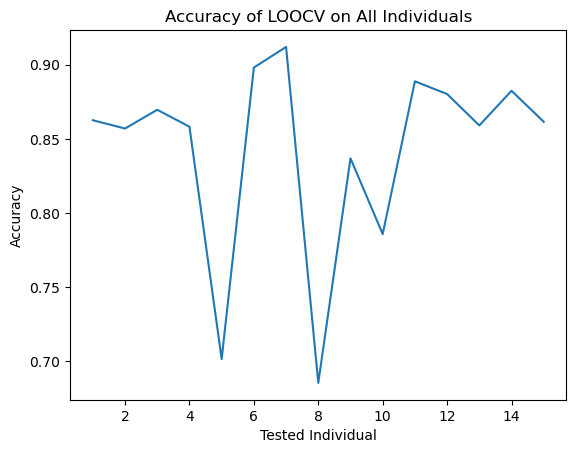

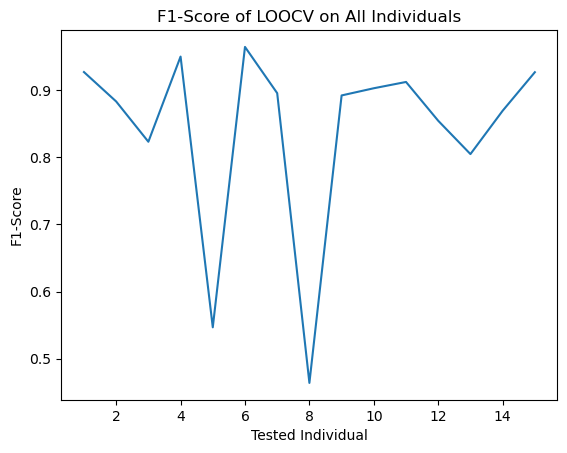

Average Accuracy:  0.8425953350039584
Average F1-Score:  0.8408835048921381


In [ ]:
# Evaluate with best C and gamma for accuracy and F1-Score
LOOCVAccuracy = np.array([])
LOOCVf1_score = np.array([])

for tester in dataframes:
    trainingFeatures = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

    testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
    testingActivity = dataframes[tester]["activity"].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    testingFeatures = StandardScaler().fit_transform(testingFeatures)
    X_train = StandardScaler().fit_transform(X_train)

    # Using best C and gamma for accuracy
    svm = SVC(C=best_C_acc, gamma=best_gamma_acc)
    svm.fit(X_train, y_train)

    y_pred = svm.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred)
    labels = ["Random", "Activity"]

    # Plot confusion matrix for accuracy
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max Accuracy when testing on {tester}; C = {best_C_acc}, gamma = {best_gamma_acc}")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))

    # Using best C and gamma for F1-Score
    svm = SVC(kernel='rbf', C=best_C_f1, gamma=best_gamma_f1)
    svm.fit(X_train, y_train)

    y_pred = svm.predict(testingFeatures)
    cmat = confusion_matrix(testingActivity, y_pred) #validate model predictions with actual y values
    labels = ["Random", "Activity"]

    # Plot confusion matrix for F1-Score
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Max F1-Score when testing on {tester}; C = {best_C_f1}, gamma = {best_gamma_f1}")
    plt.show()

    LOOCVf1_score = np.append(LOOCVf1_score, precision_score(testingActivity, y_pred, zero_division=0))

plt.plot(np.arange(1,16), LOOCVAccuracy)
plt.title("Accuracy of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1,16), LOOCVf1_score)
plt.title("F1-Score of LOOCV on All Individuals")
plt.xlabel("Tested Individual")
plt.ylabel("F1-Score")
plt.show()

print("Average Accuracy: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
print("Average F1-Score: ", sum(LOOCVf1_score) / len(LOOCVf1_score))

In [ ]:
def objective(trial):
    # Define the hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 10, 300)
    max_depth = trial.suggest_int('max_depth', 5, 30, log=True)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    bootstrap = trial.suggest_categorical('bootstrap', [True, False])
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])


In [ ]:
dataframes = {}
for i in np.arange(1, 16):
    name = f"data{i}"
    acc = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/ACC_specific_windowed_features.csv")
    hr = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/HR_specific_windowed_features.csv")
    bvp = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/BVP_specific_windowed_features.csv")
    acc['start_time'] = pd.to_datetime(acc['start_time'])
    hr['start_time'] = pd.to_datetime(hr['start_time'])
    bvp['start_time'] = pd.to_datetime(bvp['start_time'])
    acc['end_time'] = pd.to_datetime(acc['end_time'])
    hr['end_time'] = pd.to_datetime(hr['end_time'])
    bvp['end_time'] = pd.to_datetime(bvp['end_time'])

    common_columns = ['start_time', 'end_time', 'activity']
    data = acc.merge(hr, on=common_columns, how='inner').merge(bvp, on=common_columns, how='inner')
    allFeatures = [col for col in data.columns if col not in ["start_time", "end_time"]]
    data = data[allFeatures]
    data = data[~data['activity'].isin([0])]
    data.loc[data['activity'].isin([1, 2, 7, 8, 9]), 'activity'] = 0
    data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 1
    dataframes[name] = data

def objective(trial):
    # Define the hyperparameter search space
    n_estimators = trial.suggest_int('n_estimators', 10, 300)
    max_depth = trial.suggest_int('max_depth', 5, 30, log=True)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 4)
    max_features = trial.suggest_categorical('max_features', ['sqrt', 'log2', None])
    bootstrap = trial.suggest_categorical('bootstrap', [True, False])
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])

    accuracies = []
    precisions = []

    for tester in dataframes:
        testingFeatures = dataframes[tester].drop(columns=['activity']).to_numpy()
        testingActivity = dataframes[tester]['activity'].to_numpy()

        X_train = pd.DataFrame()
        y_train = pd.DataFrame()
        for trainer in dataframes:
            if trainer != tester:
                X_train = pd.concat([X_train, dataframes[trainer].drop(columns=['activity'])], ignore_index=True)
                y_train = pd.concat([y_train, dataframes[trainer]['activity']], ignore_index=True)

        X_train = X_train.to_numpy()
        y_train = y_train.to_numpy().flatten()

        scaler = StandardScaler()
        testingFeatures = scaler.fit_transform(testingFeatures)
        X_train = scaler.fit_transform(X_train)

        rf = RandomForestClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            min_samples_split=min_samples_split,
            min_samples_leaf=min_samples_leaf,
            max_features=max_features,
            bootstrap=bootstrap,
            criterion=criterion
        )
        rf.fit(X_train, y_train)
        y_pred = rf.predict(testingFeatures)

        accuracies.append(accuracy_score(testingActivity, y_pred))
        precisions.append(precision_score(testingActivity, y_pred, zero_division=0))

    avg_accuracy = np.mean(accuracies)
    avg_precision = np.mean(precisions)

    return avg_accuracy, avg_precision

# Step 3: Optimize the Objective Function
study = optuna.create_study(directions=['maximize', 'maximize'])
study.optimize(objective, n_trials=100)

# Step 4: Retrieve the Best Parameters
best_params_accuracy = study.best_trials[0].params
best_params_precision = study.best_trials[1].params

print(f"Best parameters for accuracy: {best_params_accuracy}")
print(f"Best parameters for precision: {best_params_precision}")
# Evaluate with the best parameters
LOOCVAccuracy = np.array([])
LOOCVPrecision = np.array([])

for tester in dataframes:
    # Prepare training and test data
    testingFeatures = dataframes[tester].drop(columns=['activity']).to_numpy()
    testingActivity = dataframes[tester]['activity'].to_numpy()

    X_train = pd.DataFrame()
    y_train = pd.DataFrame()
    for trainer in dataframes:
        if trainer != tester:
            X_train = pd.concat([X_train, dataframes[trainer].drop(columns=['activity'])], ignore_index=True)
            y_train = pd.concat([y_train, dataframes[trainer]['activity']], ignore_index=True)

    X_train = X_train.to_numpy()
    y_train = y_train.to_numpy().flatten()

    # Standardize the data
    scaler = StandardScaler()
    testingFeatures = scaler.fit_transform(testingFeatures)
    X_train = scaler.fit_transform(X_train)

    # Using best parameters for accuracy
    rf_acc = RandomForestClassifier(**best_params_accuracy)
    rf_acc.fit(X_train, y_train)
    y_pred_acc = rf_acc.predict(testingFeatures)

    cmat_acc = confusion_matrix(testingActivity, y_pred_acc)
    labels = ["Random", "Activity"]

    # Plot confusion matrix for accuracy
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat_acc, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Best Accuracy Parameters (Tested on {tester})")
    plt.show()

    LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred_acc))

    # Using best parameters for precision
    rf_prec = RandomForestClassifier(**best_params_precision)
    rf_prec.fit(X_train, y_train)
    y_pred_prec = rf_prec.predict(testingFeatures)

    cmat_prec = confusion_matrix(testingActivity, y_pred_prec)

    # Plot confusion matrix for precision
    plt.figure(figsize=(8, 6))
    sns.heatmap(cmat_prec, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f"Confusion Matrix for Best Precision Parameters (Tested on {tester})")
    plt.show()

    LOOCVPrecision = np.append(LOOCVPrecision, precision_score(testingActivity, y_pred_prec, zero_division=0))

# Plot accuracy and precision
plt.plot(np.arange(1, len(LOOCVAccuracy) + 1), LOOCVAccuracy, marker='o')
plt.title("Accuracy of LOOCV on All Individuals with Best Accuracy Parameters")
plt.xlabel("Tested Individual")
plt.ylabel("Accuracy")
plt.show()

plt.plot(np.arange(1, len(LOOCVPrecision) + 1), LOOCVPrecision, marker='o')
plt.title("Precision of LOOCV on All Individuals with Best Precision Parameters")
plt.xlabel("Tested Individual")
plt.ylabel("Precision")
plt.show()

print("Average Accuracy with Best Accuracy Parameters: ", np.mean(LOOCVAccuracy))
print("Average Precision with Best Precision Parameters: ", np.mean(LOOCVPrecision))

Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 10} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5,

Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 10} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 50} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 5,

Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 50} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100} tested!
Parameters: {'bootstrap': True, 'criterion': 'gini', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200} tested!


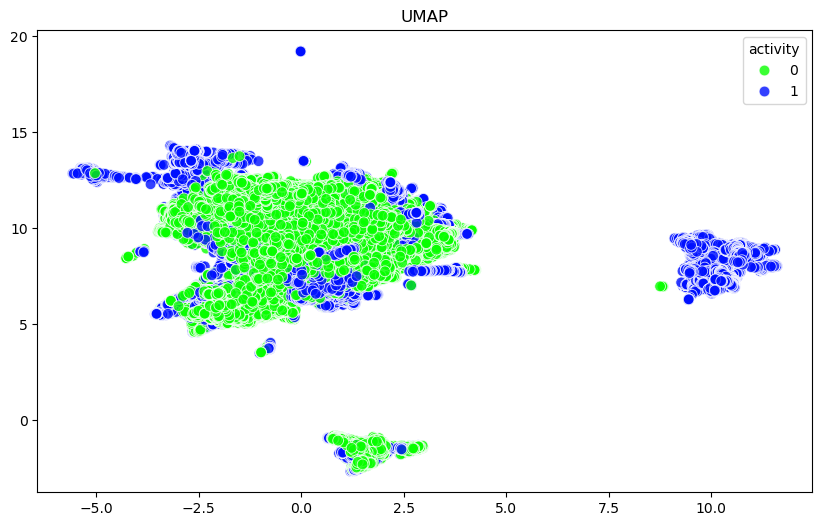

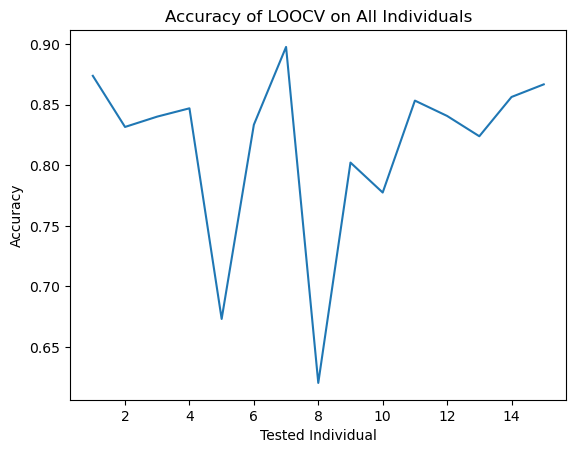

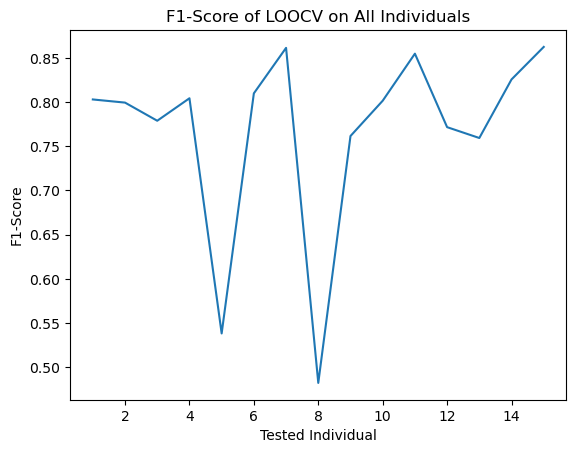

Average Best Accuracy for length = 4 and offset = 1:  0.8158371996824809
Average Best F1-Score for length = 4 and offset = 1:  0.7677038039597499


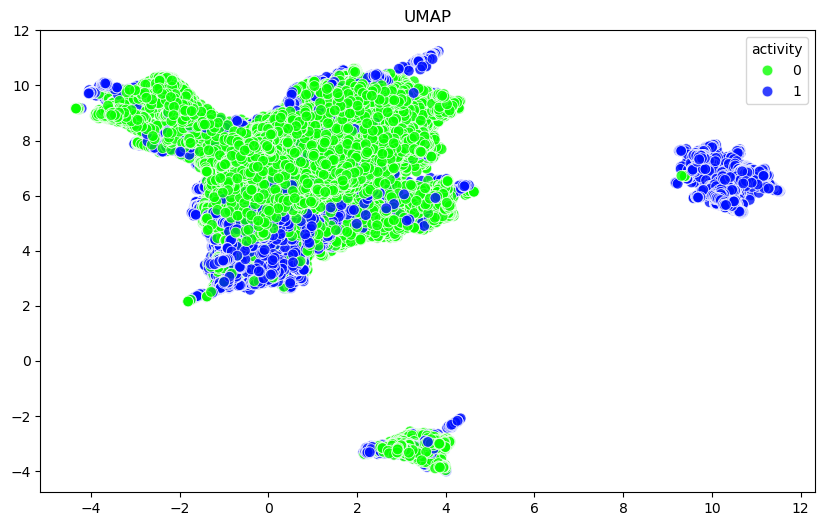

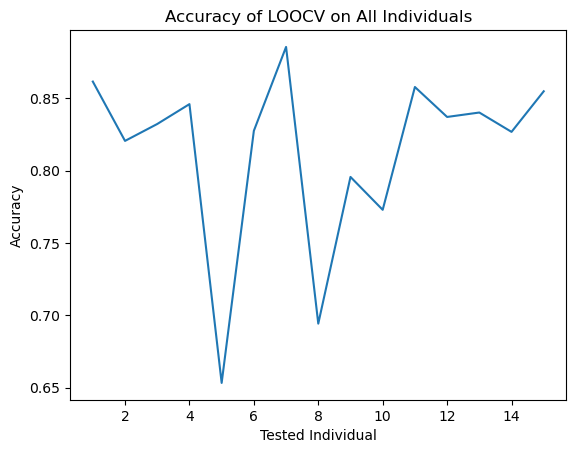

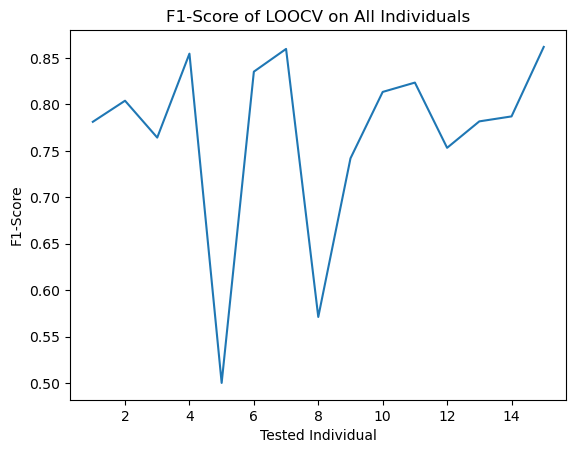

Average Best Accuracy for length = 4 and offset = 2:  0.8136405993659501
Average Best F1-Score for length = 4 and offset = 2:  0.768935544876679


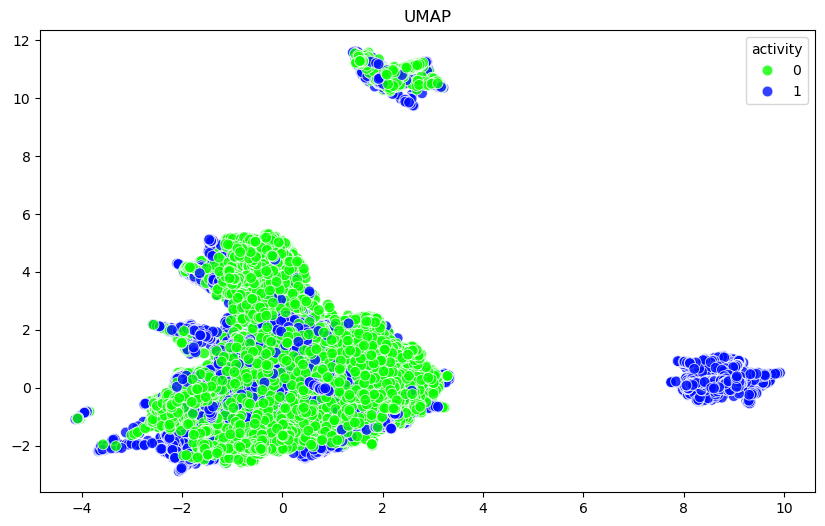

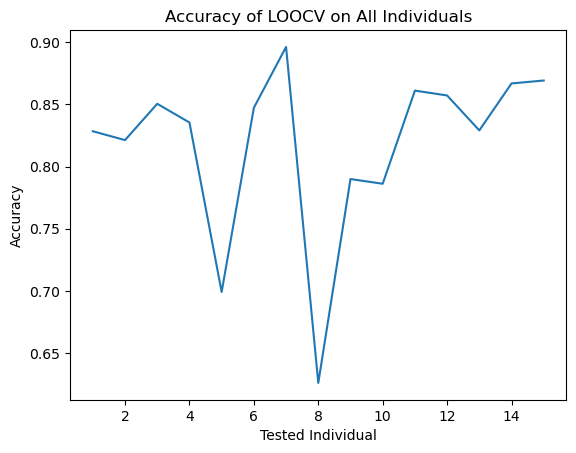

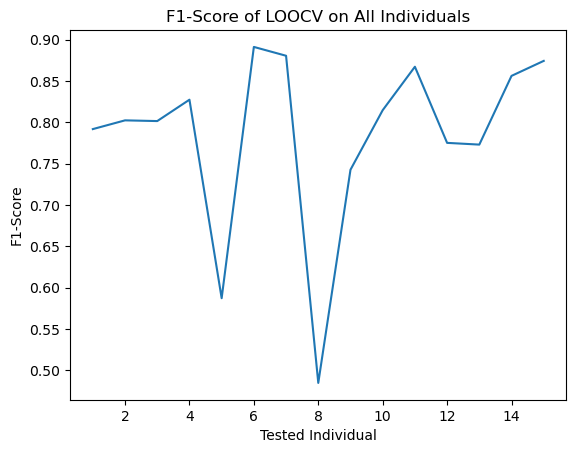

Average Best Accuracy for length = 4 and offset = 3:  0.817544995805677
Average Best F1-Score for length = 4 and offset = 3:  0.784710516282152


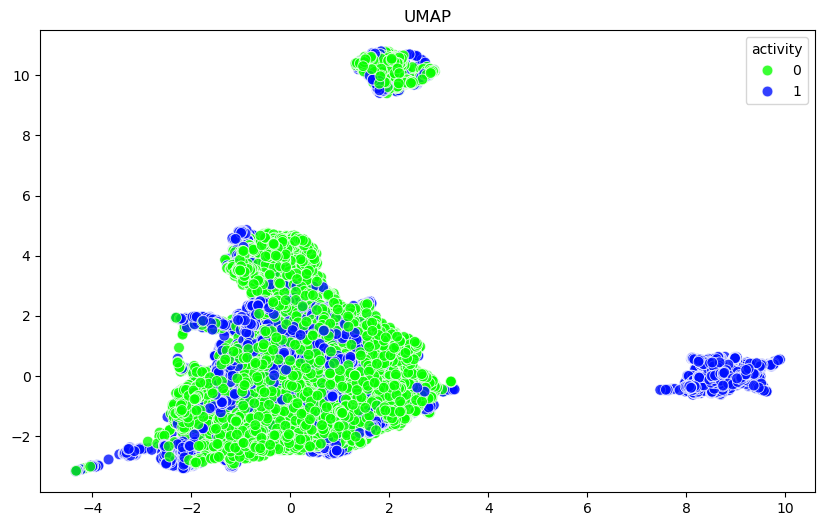

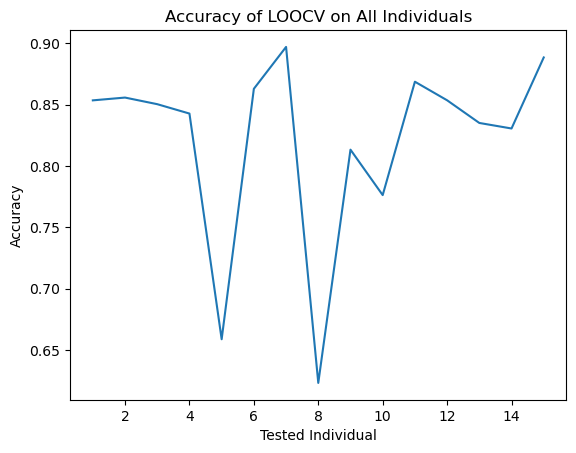

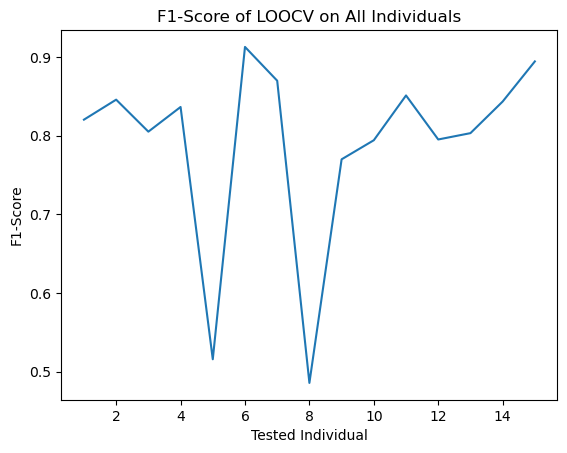

Average Best Accuracy for length = 4 and offset = 4:  0.8206938133151988
Average Best F1-Score for length = 4 and offset = 4:  0.7896238150529677


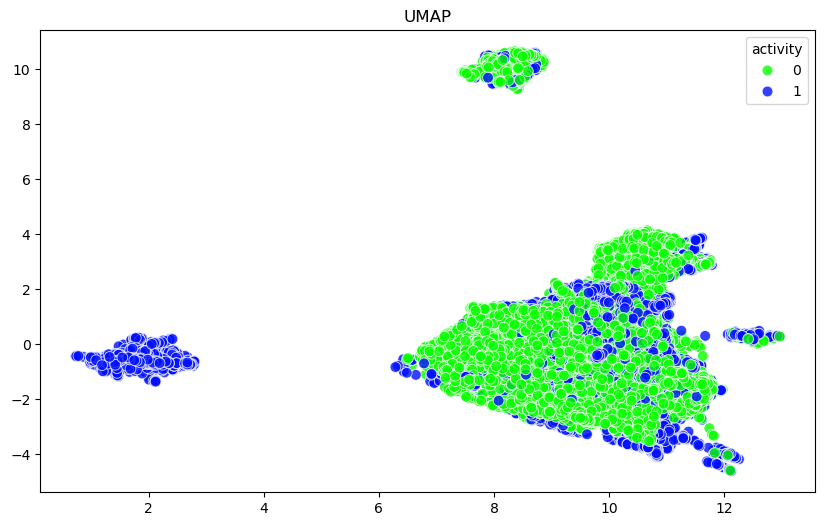

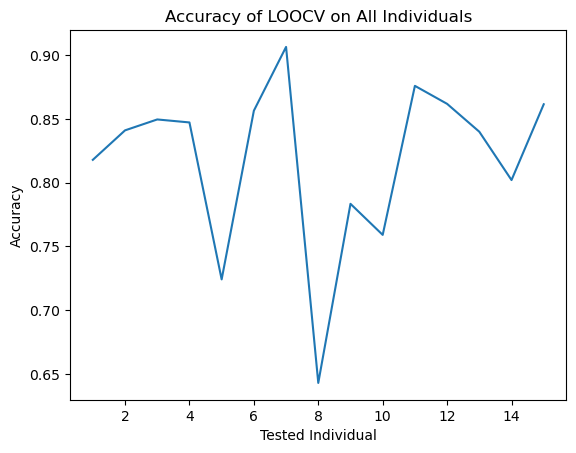

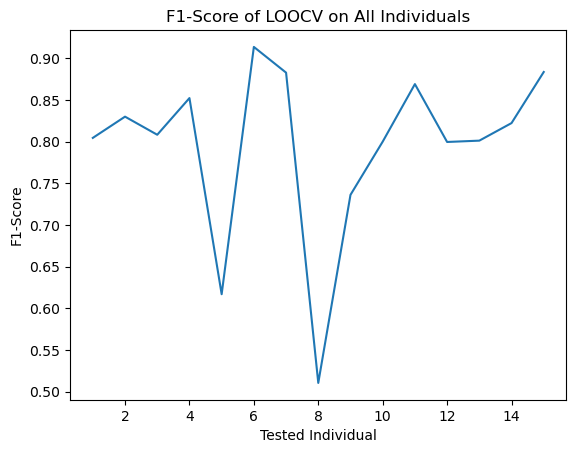

Average Best Accuracy for length = 4 and offset = 5:  0.8179082608821485
Average Best F1-Score for length = 4 and offset = 5:  0.7953870536626179


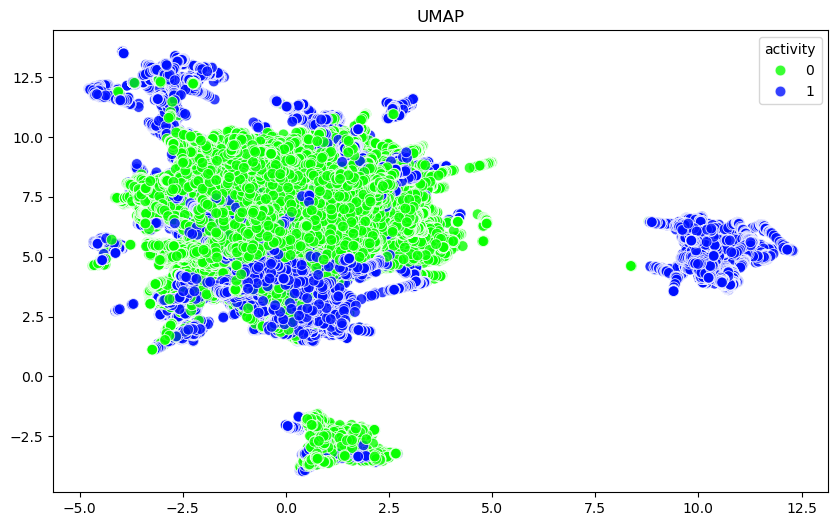

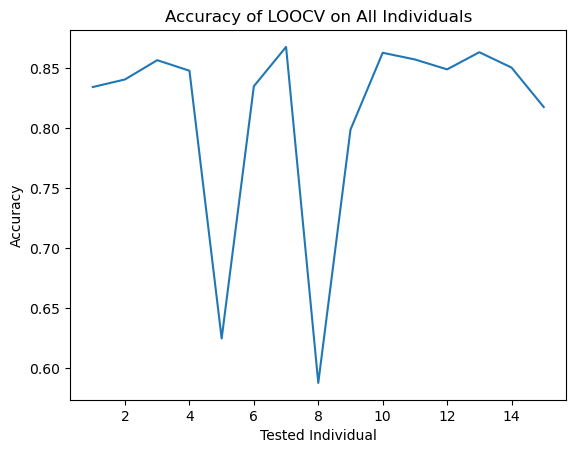

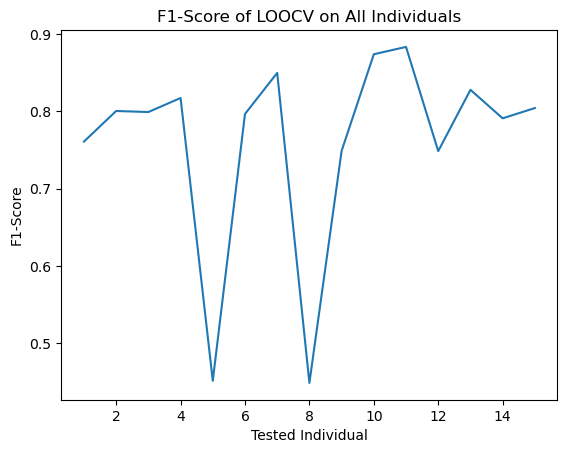

Average Best Accuracy for length = 5 and offset = 1:  0.8131103000477996
Average Best F1-Score for length = 5 and offset = 1:  0.7600831537022023


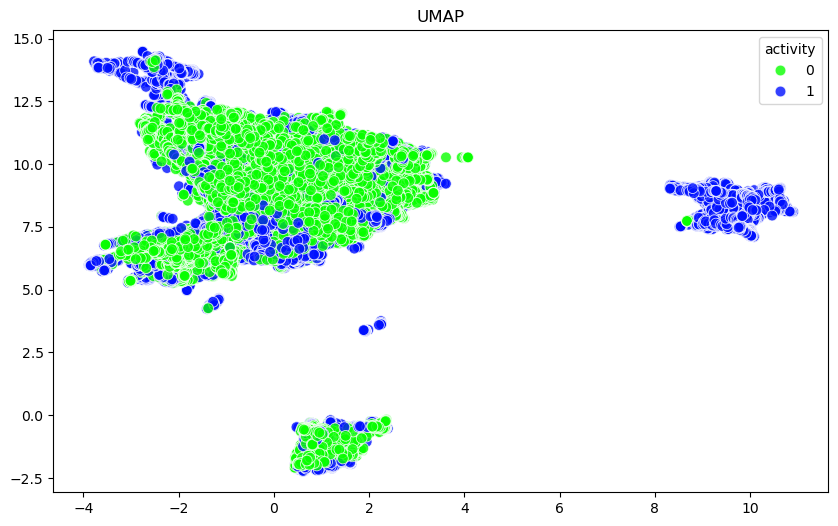

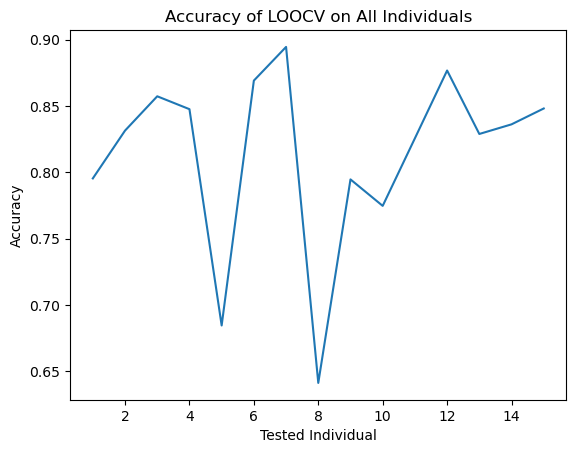

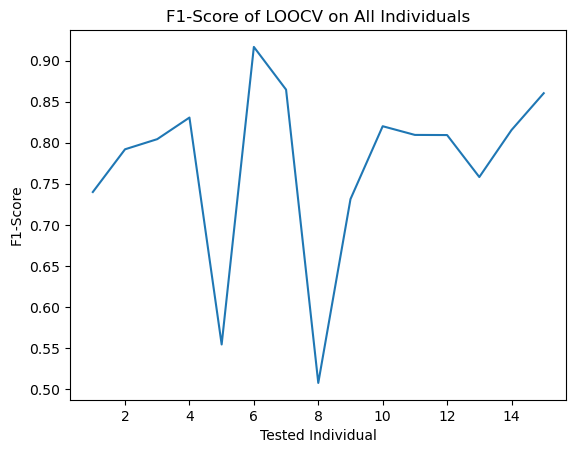

Average Best Accuracy for length = 5 and offset = 2:  0.8137907558716216
Average Best F1-Score for length = 5 and offset = 2:  0.7742773893291173


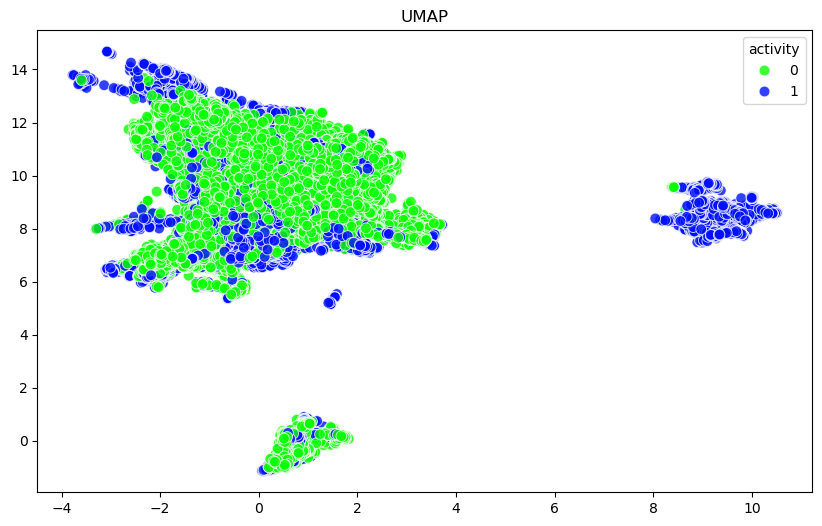

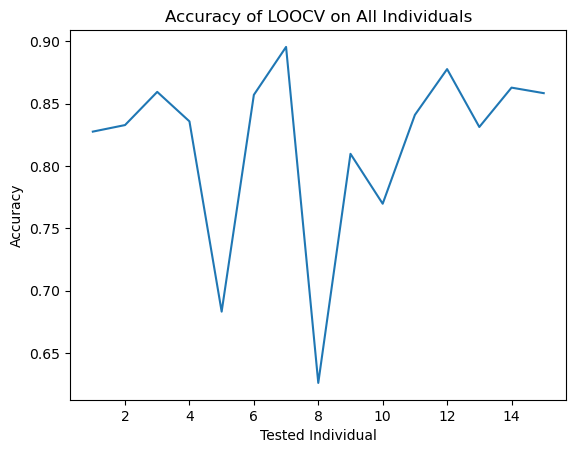

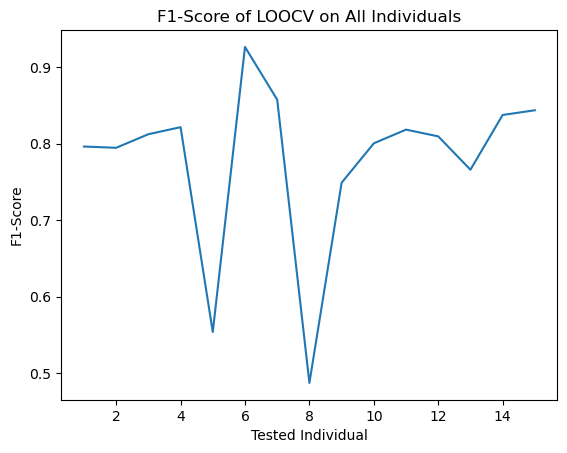

Average Best Accuracy for length = 5 and offset = 3:  0.8179427731621269
Average Best F1-Score for length = 5 and offset = 3:  0.7781291694522581


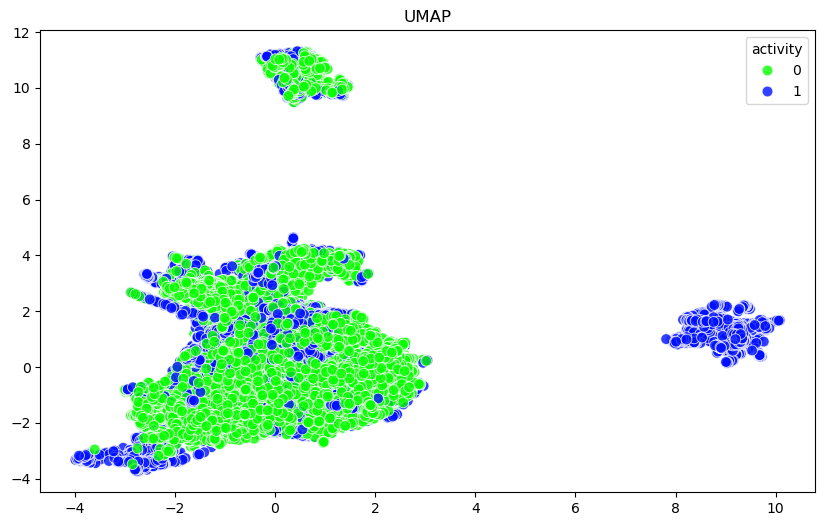

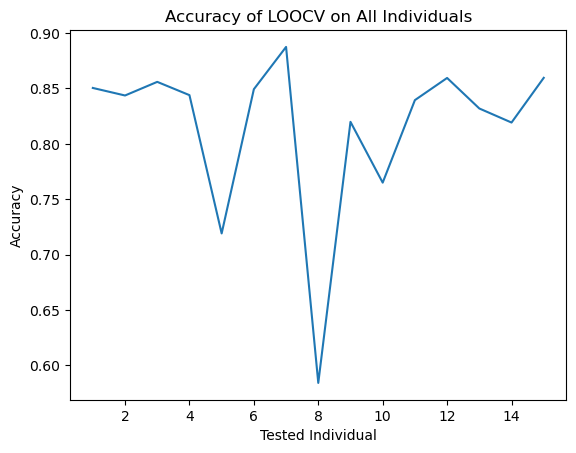

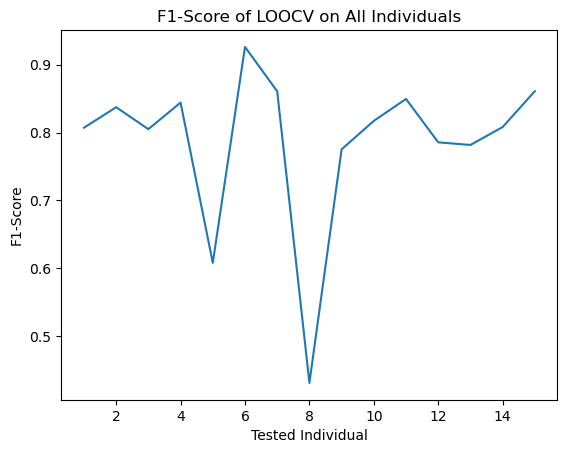

Average Best Accuracy for length = 5 and offset = 4:  0.8152061587918816
Average Best F1-Score for length = 5 and offset = 4:  0.7865878368867903


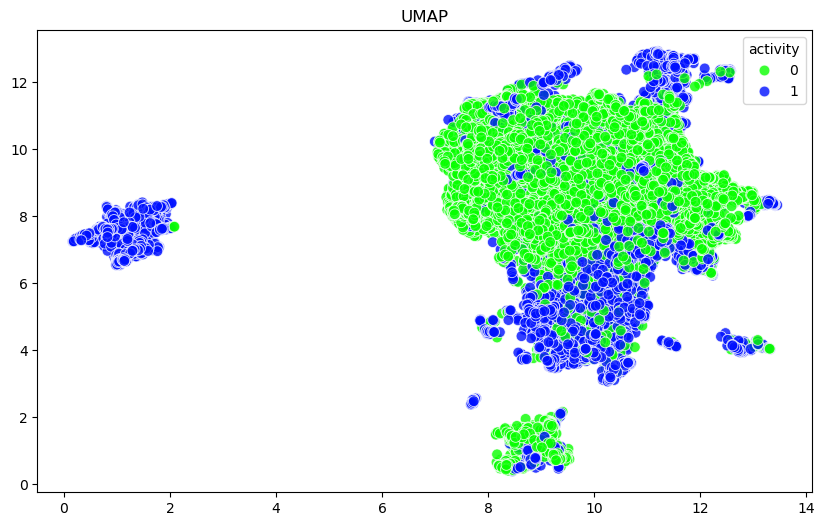

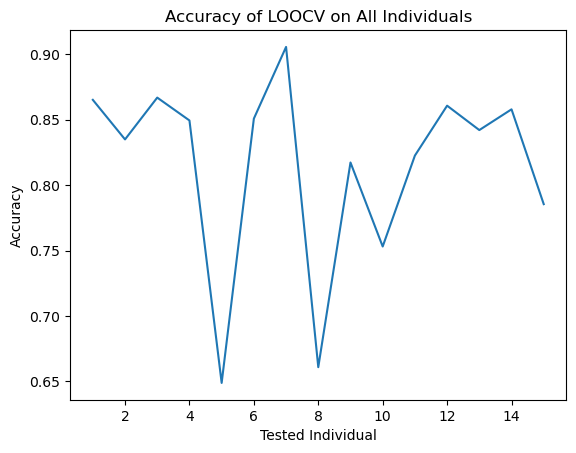

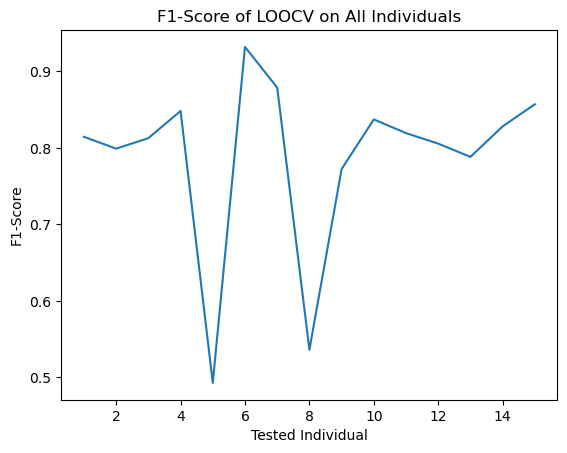

Average Best Accuracy for length = 5 and offset = 5:  0.814780530879656
Average Best F1-Score for length = 5 and offset = 5:  0.7881696352603431


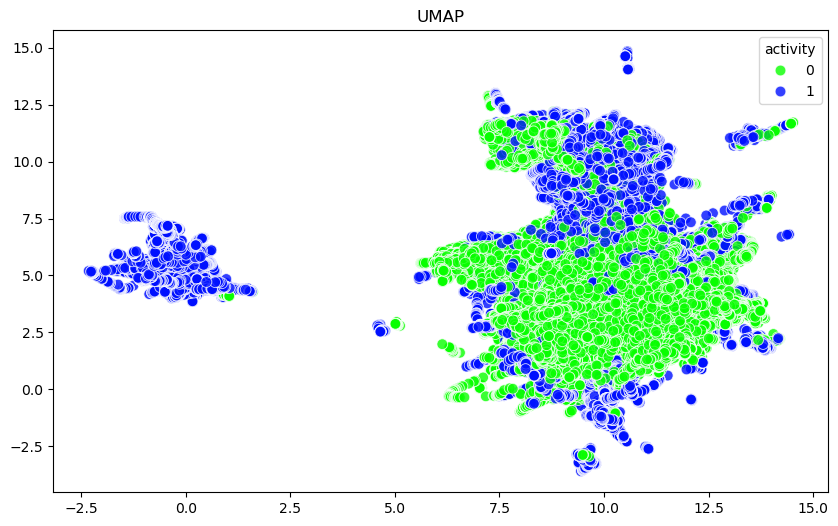

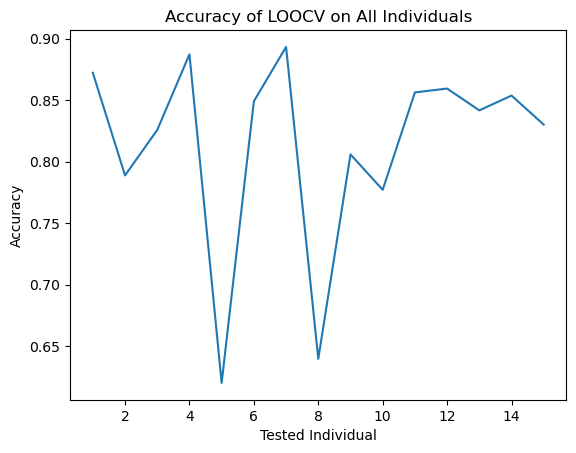

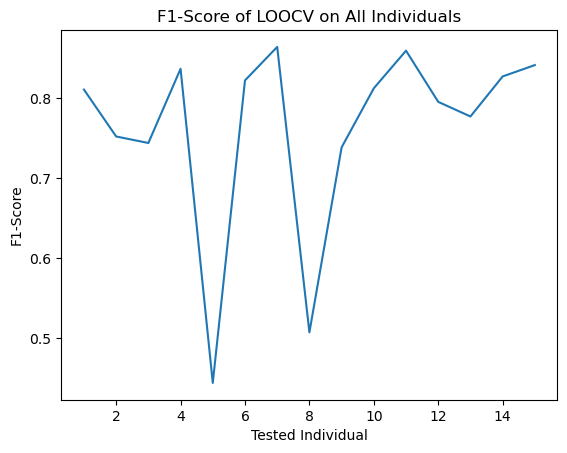

Average Best Accuracy for length = 6 and offset = 1:  0.8132959614435322
Average Best F1-Score for length = 6 and offset = 1:  0.7625256664242382


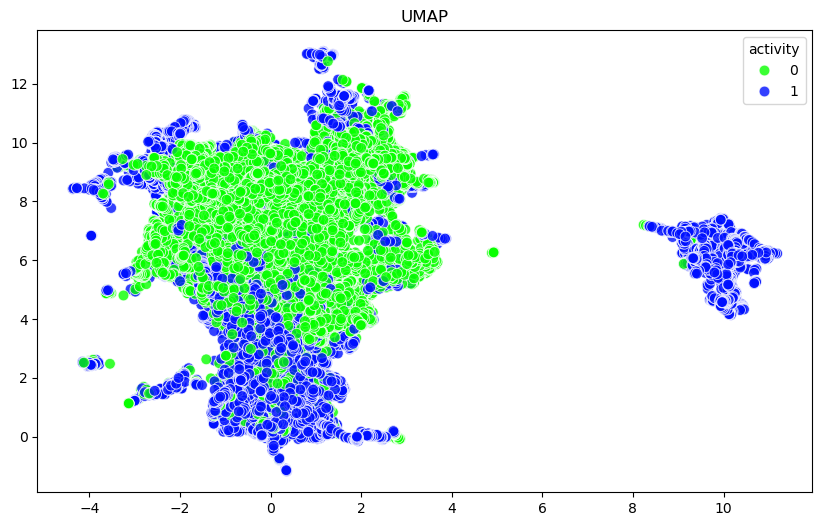

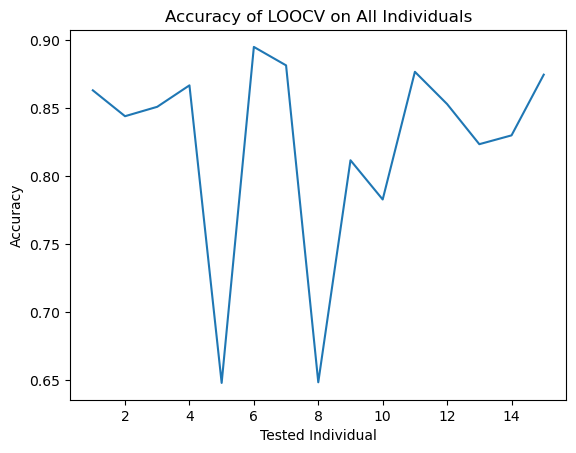

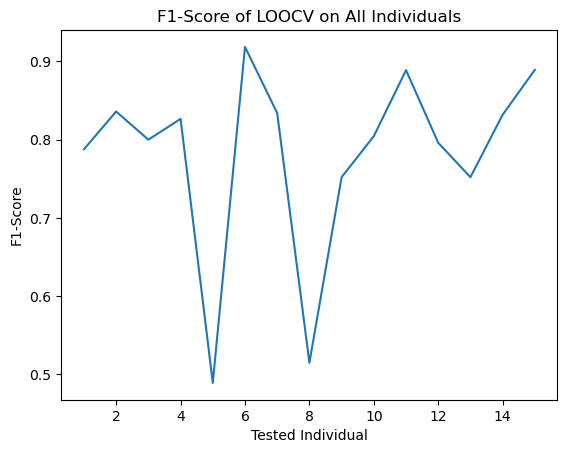

Average Best Accuracy for length = 6 and offset = 2:  0.8232032007733782
Average Best F1-Score for length = 6 and offset = 2:  0.7814125432561193


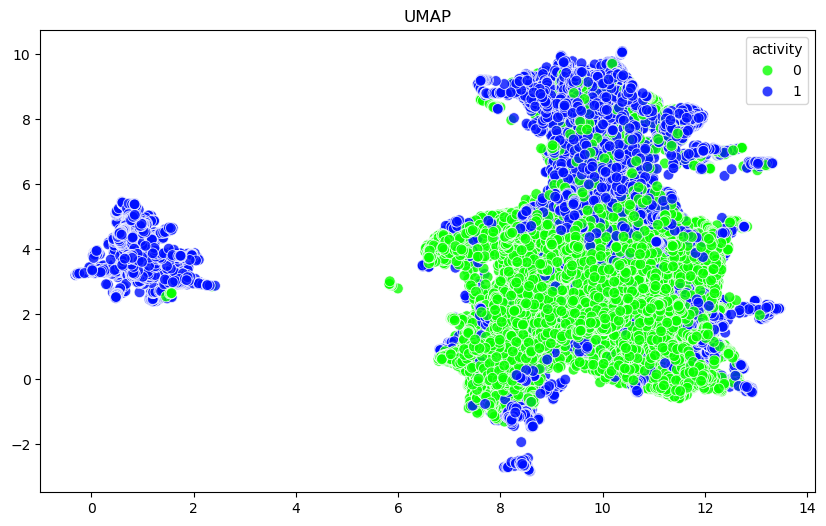

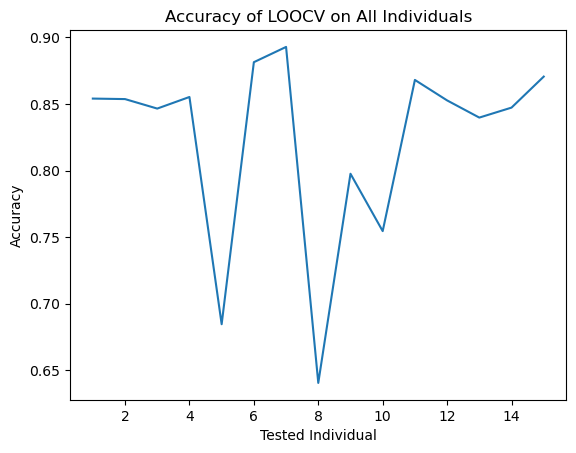

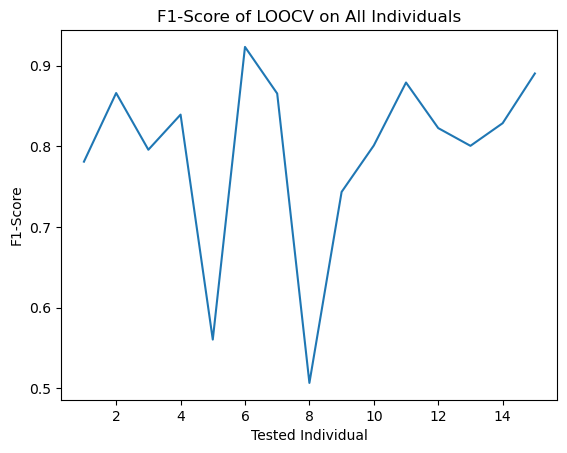

Average Best Accuracy for length = 6 and offset = 3:  0.8225961493469498
Average Best F1-Score for length = 6 and offset = 3:  0.7934569319211155


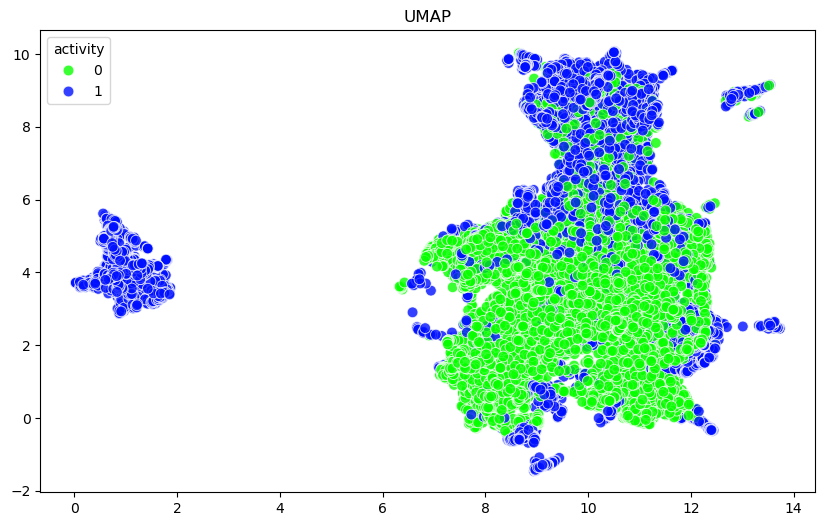

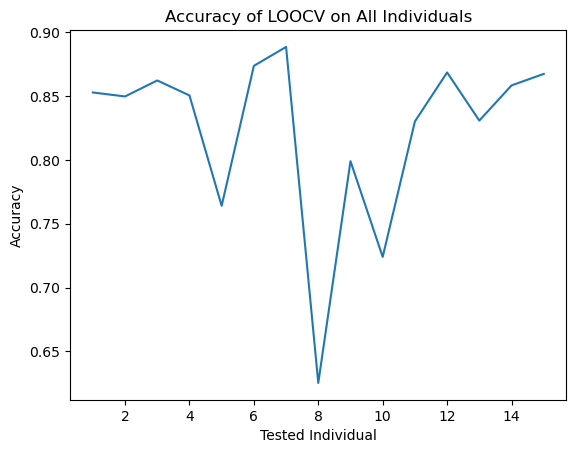

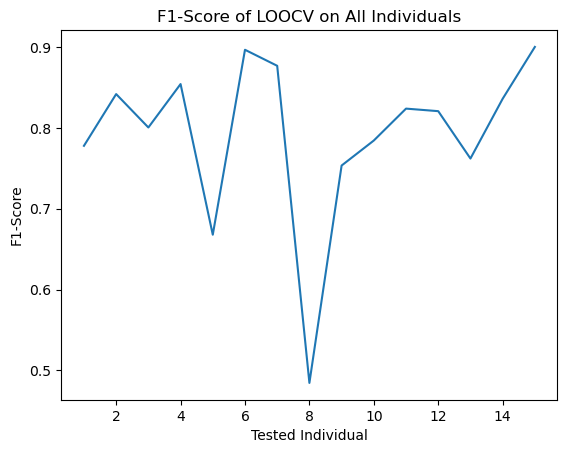

Average Best Accuracy for length = 6 and offset = 4:  0.8230172363586095
Average Best F1-Score for length = 6 and offset = 4:  0.7921796430050773


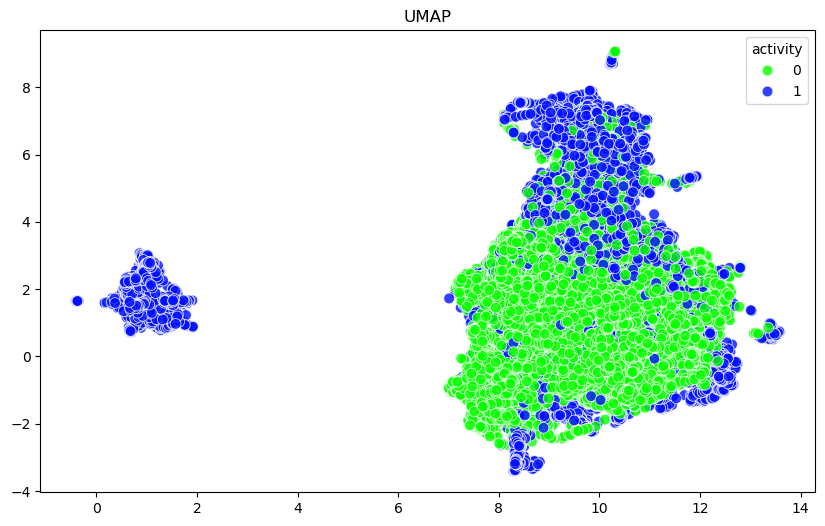

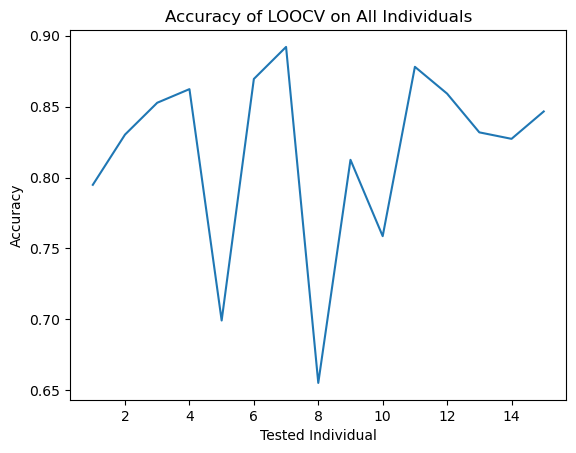

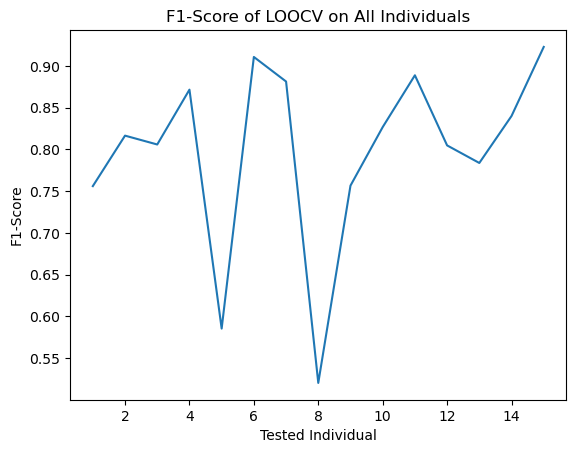

Average Best Accuracy for length = 6 and offset = 5:  0.8180316871770085
Average Best F1-Score for length = 6 and offset = 5:  0.7981624892169354


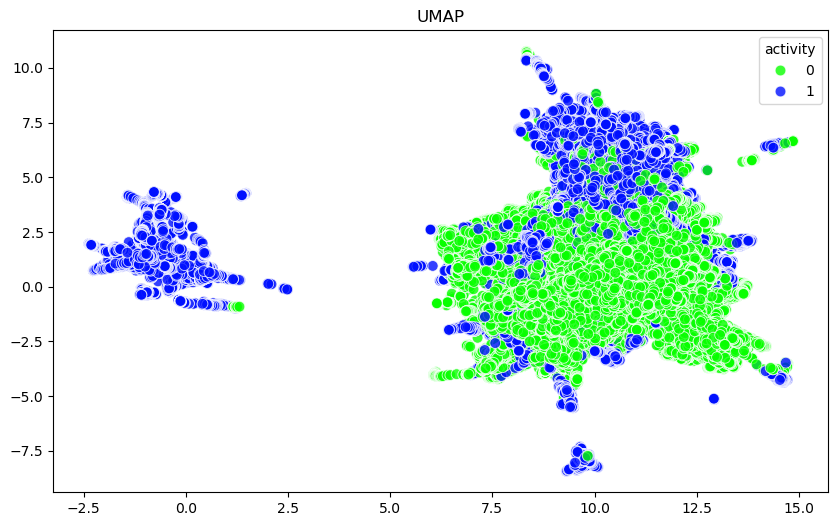

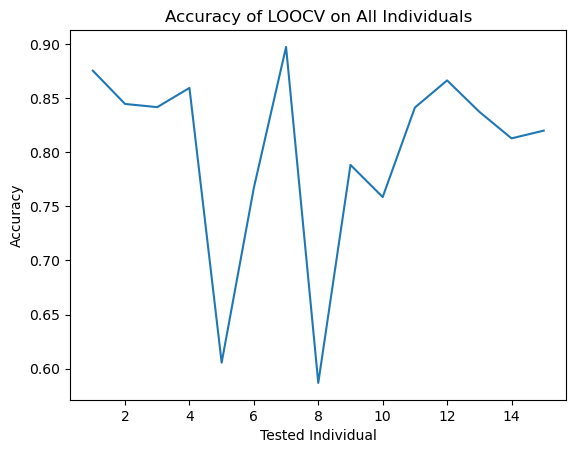

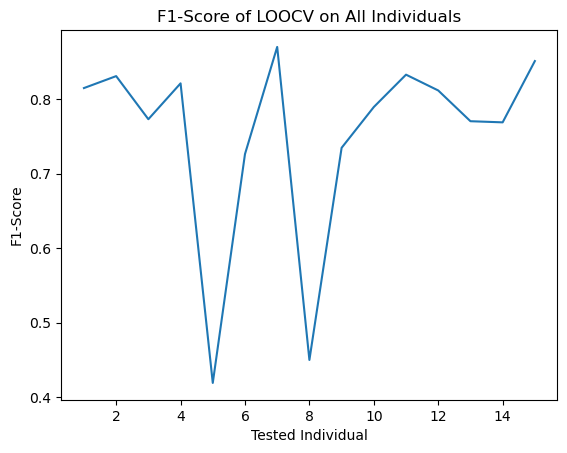

Average Best Accuracy for length = 7 and offset = 1:  0.8001399766457538
Average Best F1-Score for length = 7 and offset = 1:  0.7506973146334118


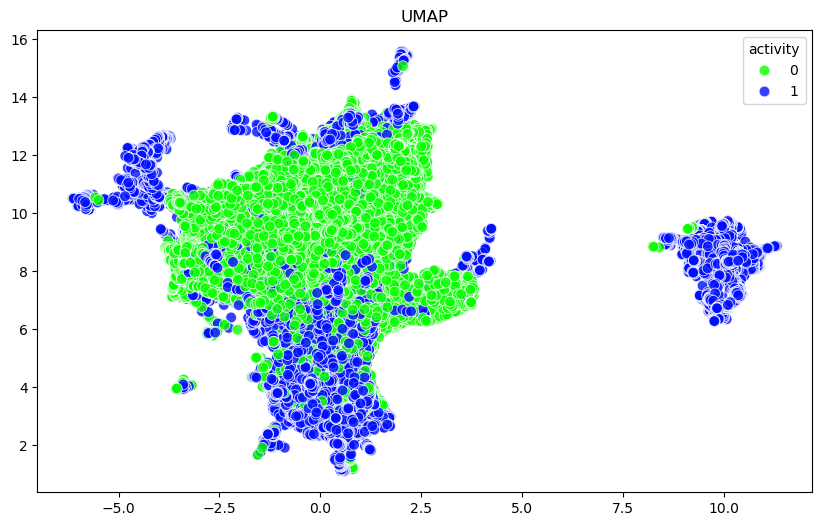

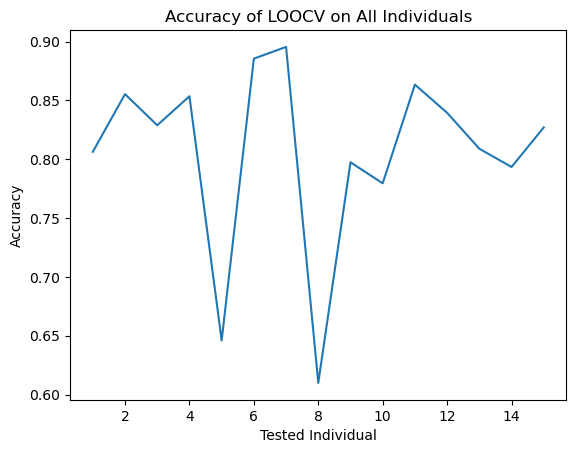

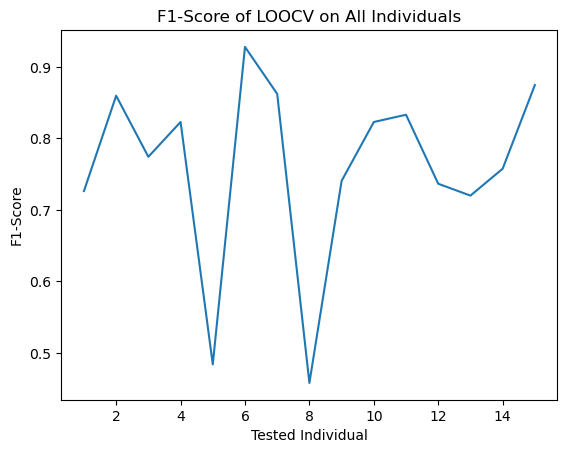

Average Best Accuracy for length = 7 and offset = 2:  0.806062792752397
Average Best F1-Score for length = 7 and offset = 2:  0.7600946771513295


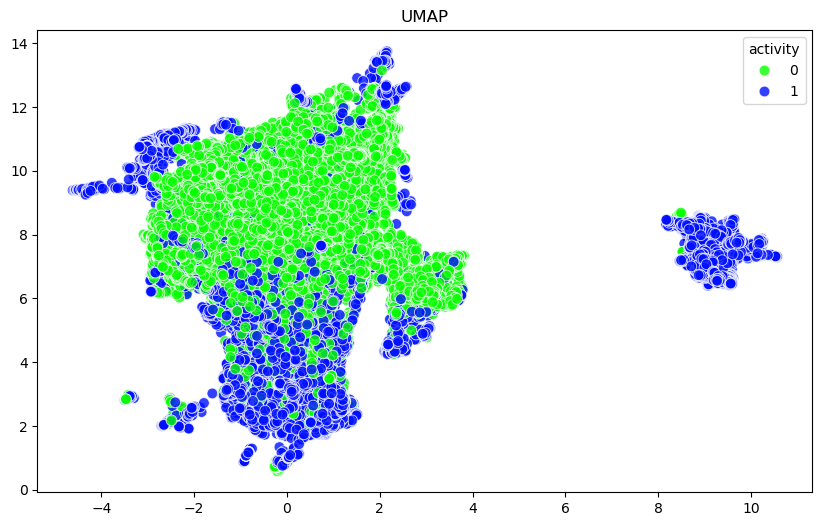

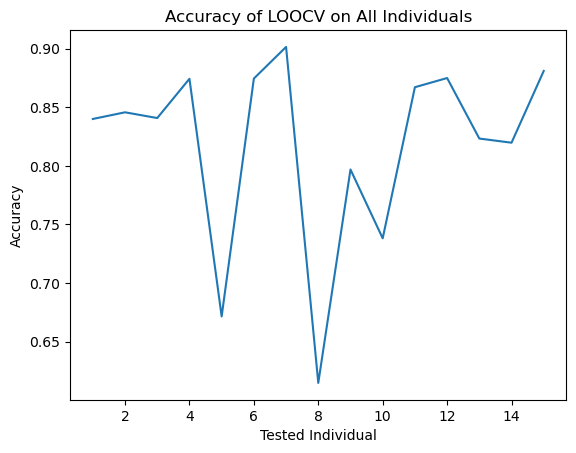

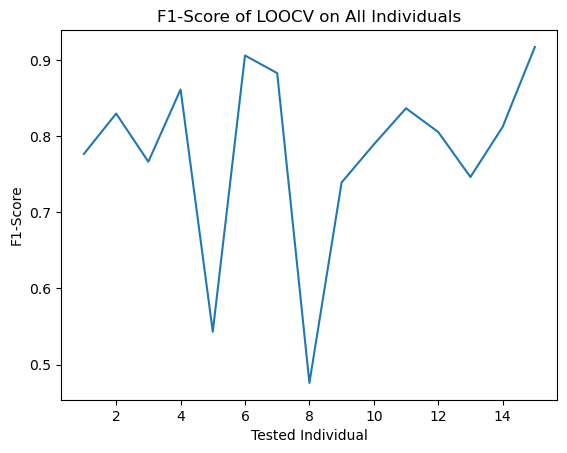

Average Best Accuracy for length = 7 and offset = 3:  0.8175589795152174
Average Best F1-Score for length = 7 and offset = 3:  0.7791470796394081


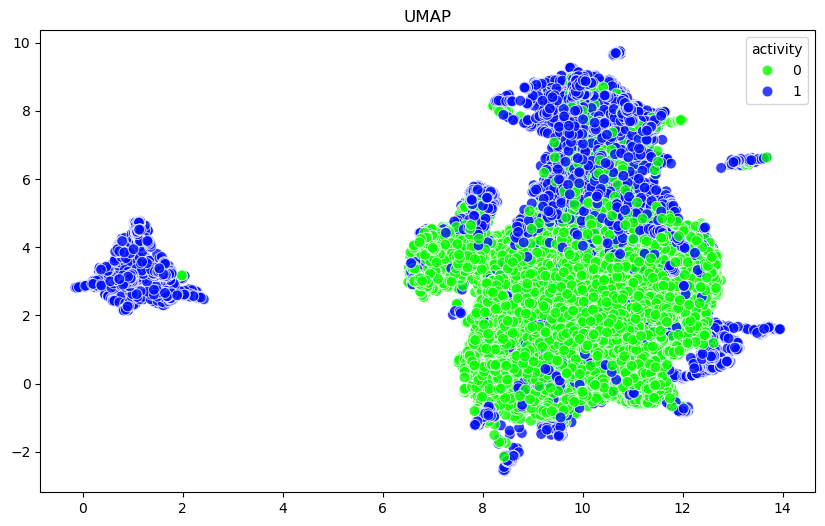

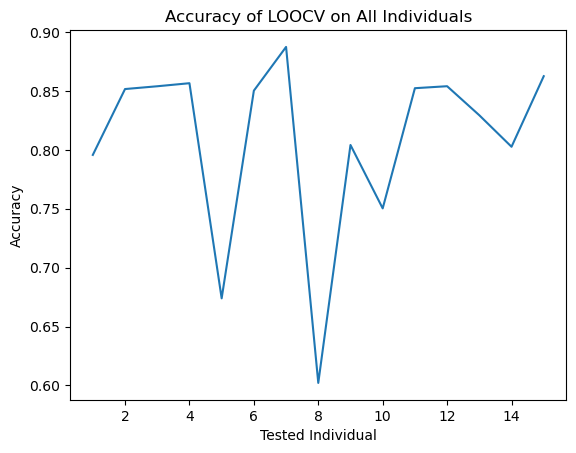

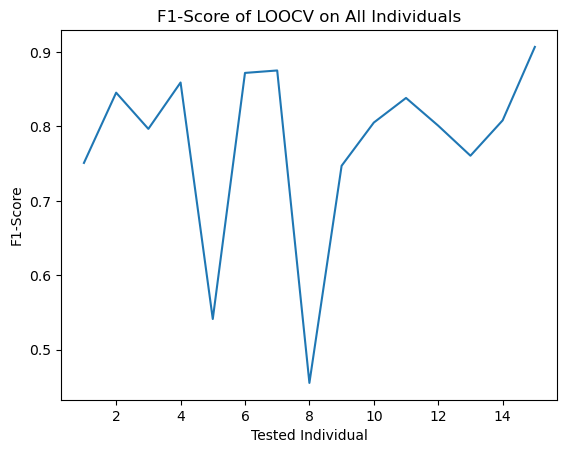

Average Best Accuracy for length = 7 and offset = 4:  0.8084316253384571
Average Best F1-Score for length = 7 and offset = 4:  0.7775221162818252


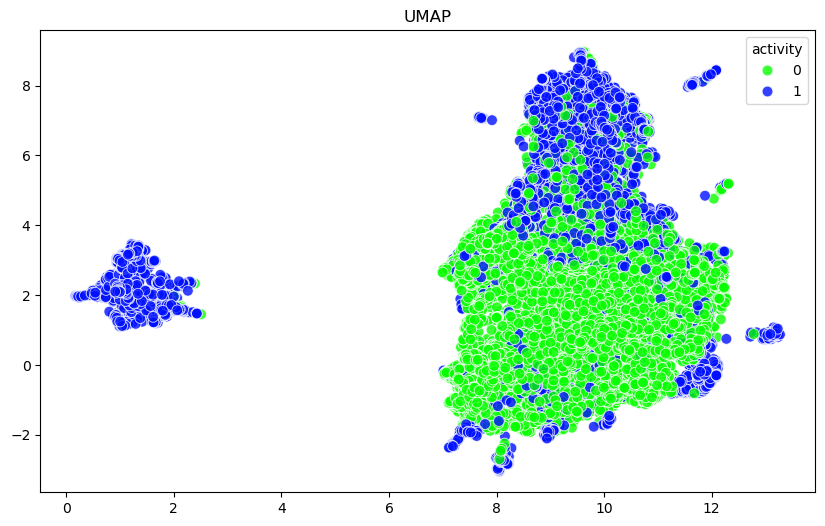

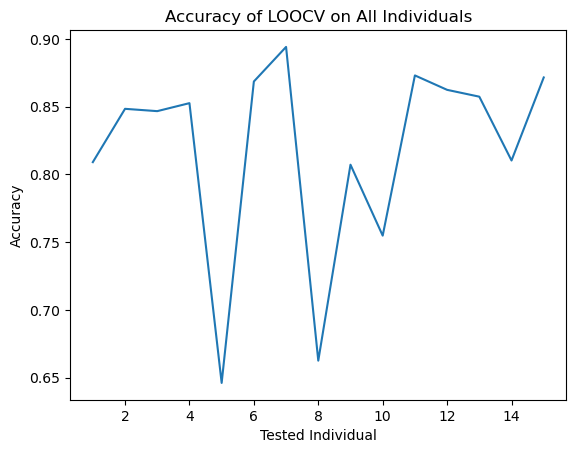

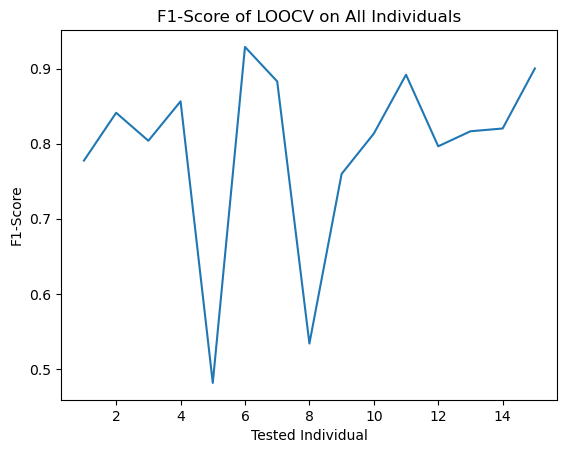

Average Best Accuracy for length = 7 and offset = 5:  0.8177167487298193
Average Best F1-Score for length = 7 and offset = 5:  0.7936485282367947


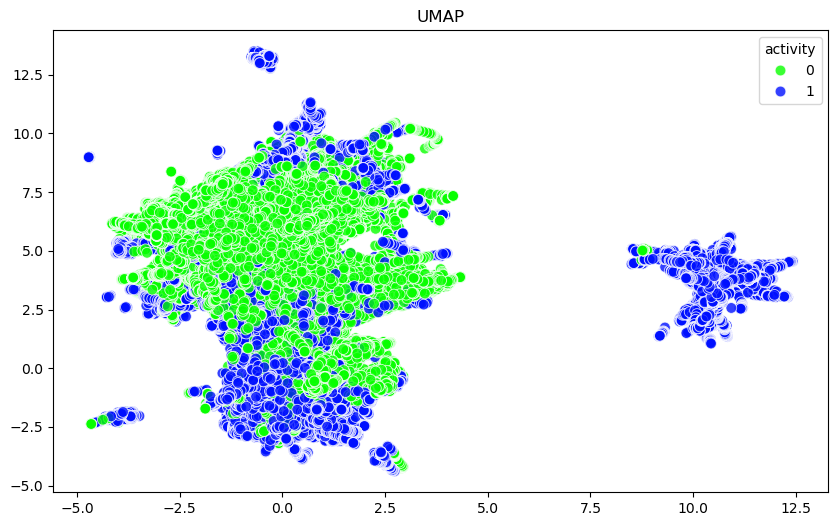

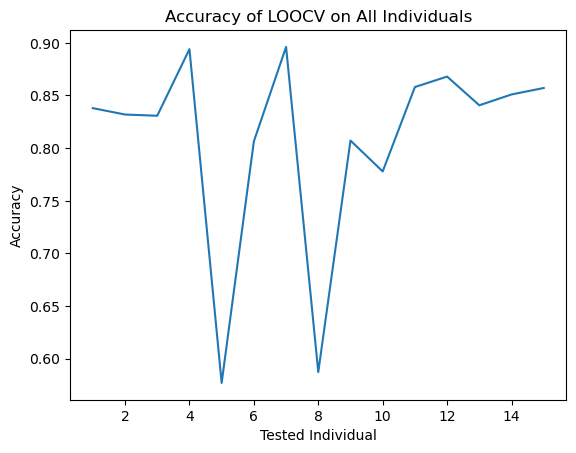

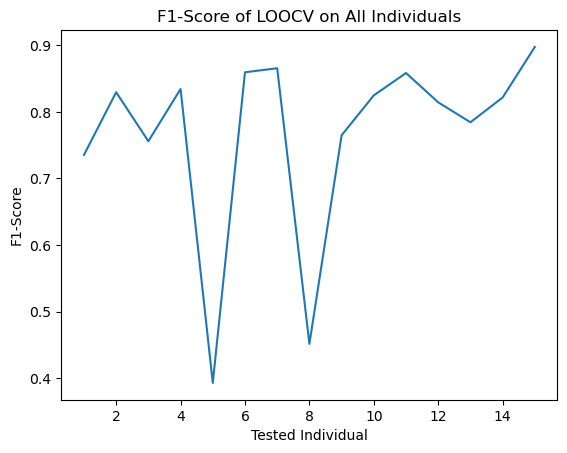

Average Best Accuracy for length = 8 and offset = 1:  0.8080983869125156
Average Best F1-Score for length = 8 and offset = 1:  0.7661292222539592


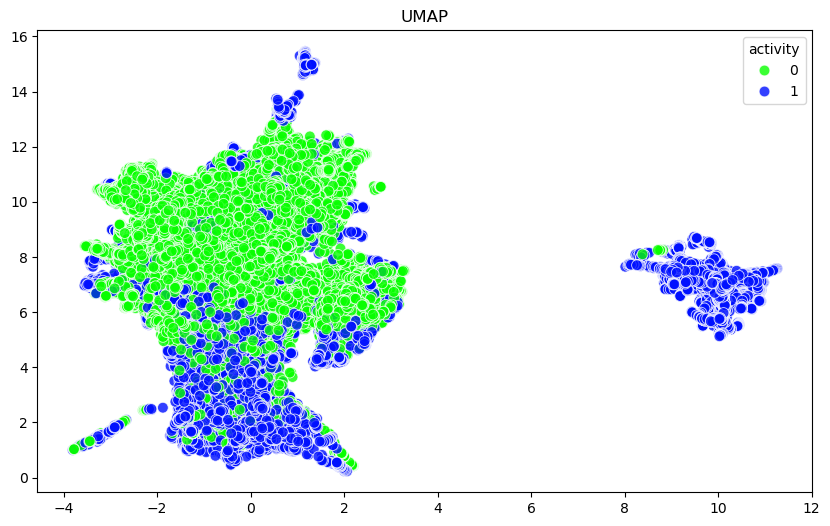

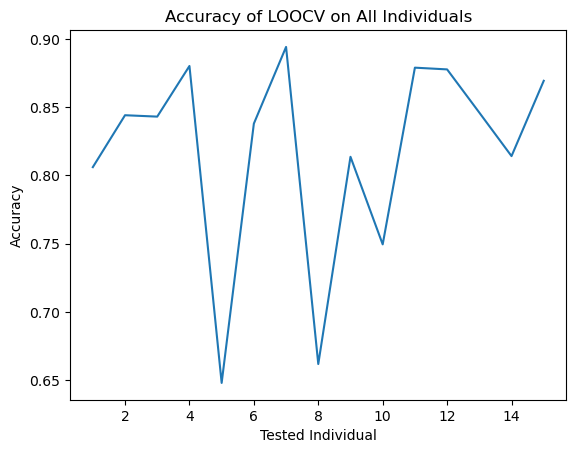

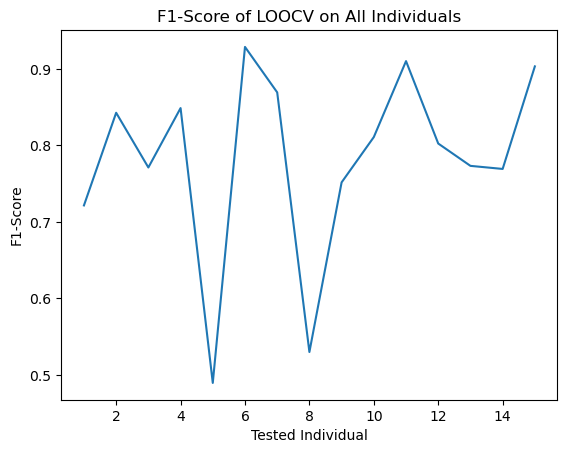

Average Best Accuracy for length = 8 and offset = 2:  0.8176645610948248
Average Best F1-Score for length = 8 and offset = 2:  0.7814385404676572


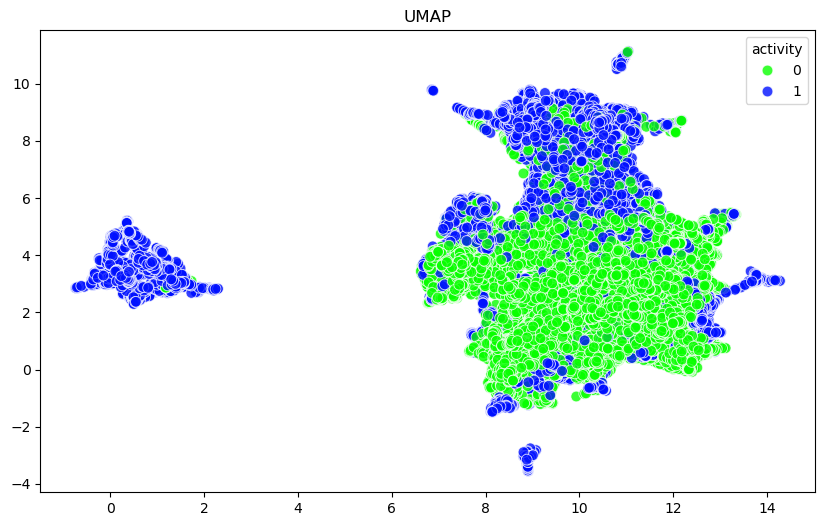

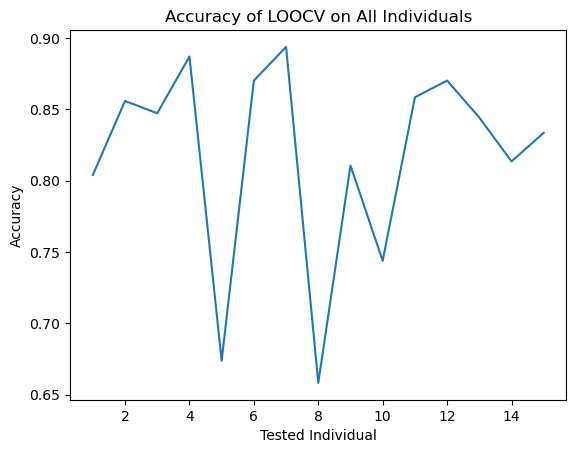

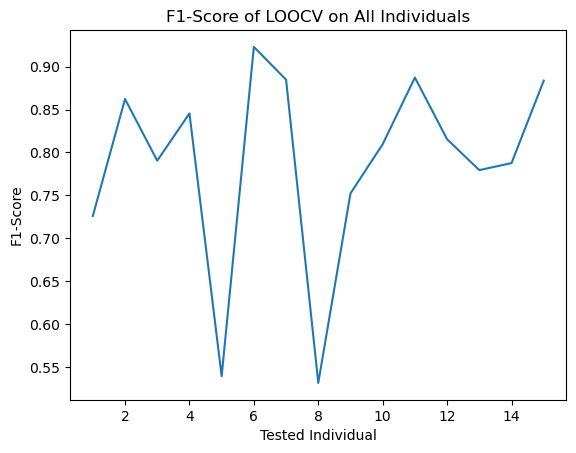

Average Best Accuracy for length = 8 and offset = 3:  0.817673998256407
Average Best F1-Score for length = 8 and offset = 3:  0.7879274790412243


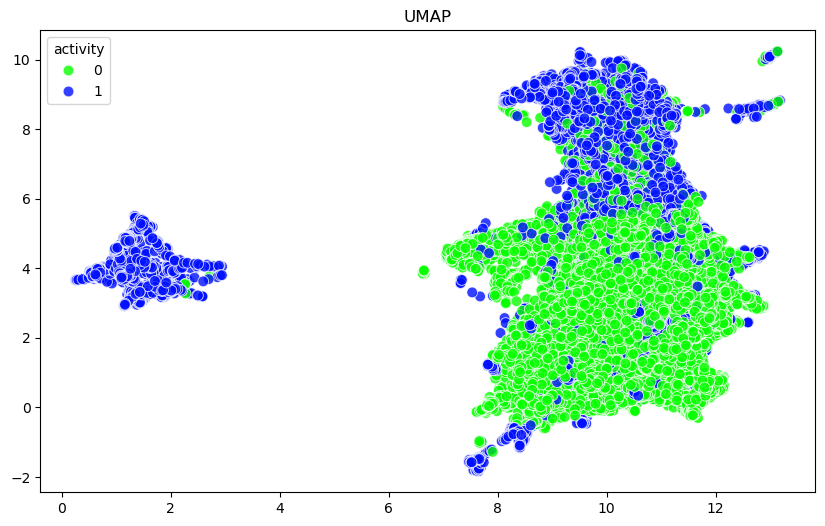

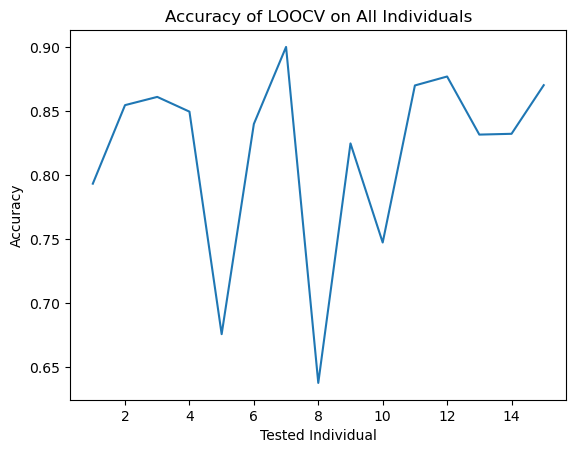

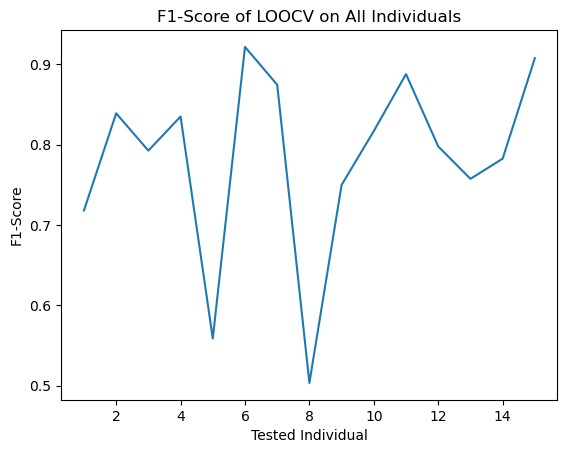

Average Best Accuracy for length = 8 and offset = 4:  0.8176466630149127
Average Best F1-Score for length = 8 and offset = 4:  0.7830052463788147


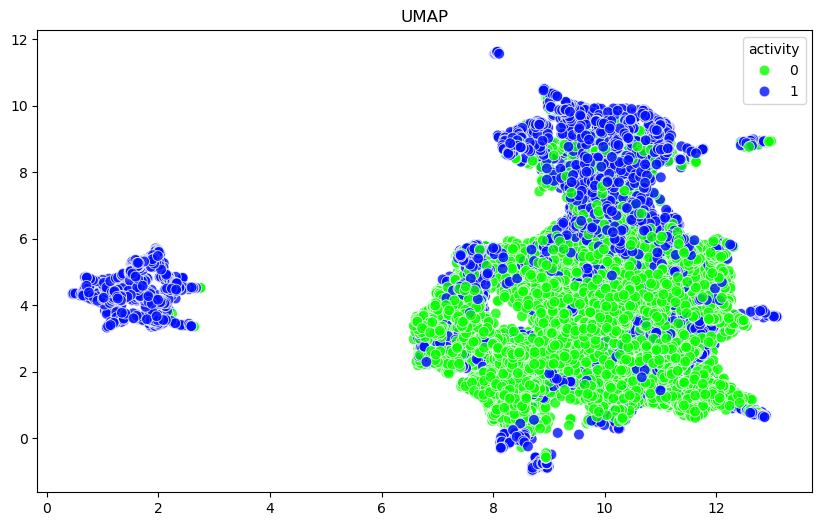

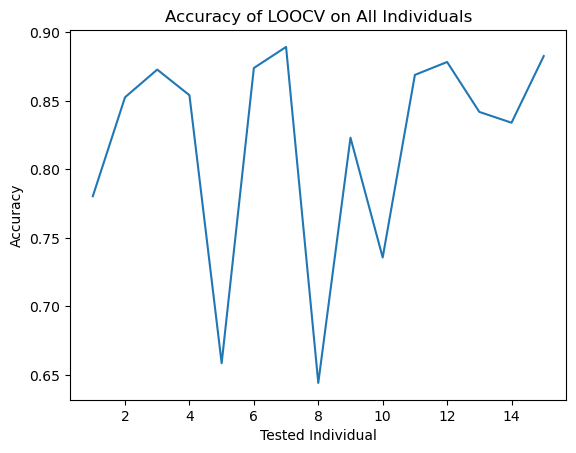

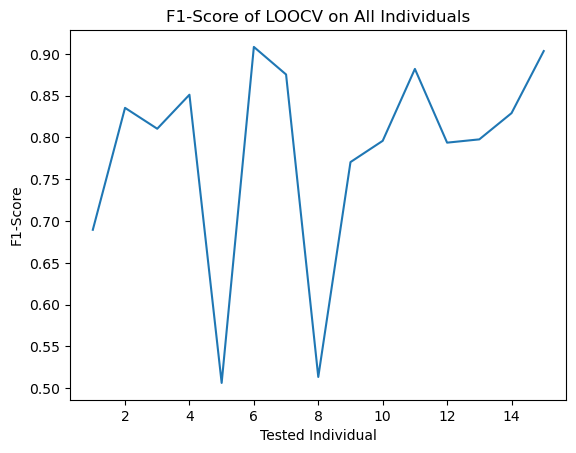

Average Best Accuracy for length = 8 and offset = 5:  0.8194456391953975
Average Best F1-Score for length = 8 and offset = 5:  0.784119357411522


In [ ]:
for length in [4, 5, 6, 7, 8]:
    for offset in [1, 2, 3, 4, 5]:
        dataframes = {}
        for i in np.arange(1, 16):
            name = f"data{i}"
            acc = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/complex_windows/length_{length}/offset_{offset}.csv")
            hr = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/complex_windows/length_{length}/HR_offset_{offset}.csv")
            bvp = pd.read_csv(f"HAR/ppg+dalia/data/PPG_FieldStudy/S{i}/S{i}_E4/complex_windows/length_{length}/BVP_offset_{offset}.csv")
            acc['start_time'] = pd.to_datetime(acc['start_time'])
            hr['start_time'] = pd.to_datetime(hr['start_time'])
            bvp['start_time'] = pd.to_datetime(bvp['start_time'])
            acc['end_time'] = pd.to_datetime(acc['end_time'])
            hr['end_time'] = pd.to_datetime(hr['end_time'])
            bvp['end_time'] = pd.to_datetime(bvp['end_time'])

            common_columns = ['start_time', 'end_time', 'activity']
            data = acc.merge(hr, on=common_columns, how='inner').merge(bvp, on=common_columns, how='inner')
            allFeatures = [col for col in data.columns if col not in ["start_time", "end_time"]]
            data = data[allFeatures]
            data = data[~data['activity'].isin([0])]
            data.loc[data['activity'].isin([1, 2, 7, 8, 9]), 'activity'] = 0
            data.loc[data['activity'].isin([3, 4, 5, 6]), 'activity'] = 1
            dataframes[name] = data

        combined_df = pd.concat(dataframes.values(), ignore_index=True)
        numerical_cols = [col for col in combined_df.columns if col != 'activity']
        scaled_data = StandardScaler().fit_transform(combined_df[numerical_cols])

        umap_reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3)
        X_umap = umap_reducer.fit_transform(scaled_data)
        tsne_df = pd.DataFrame(data=X_umap, columns=[f'UMAP{i}' for i in np.arange(1, 4)])
        tsne_df['activity'] = combined_df['activity']

        plot_clusters(X_umap, tsne_df['activity'], "UMAP")

        start_idx = 0
        for key, df in dataframes.items():
            end_idx = start_idx + len(df)
            dataframes[key] = tsne_df.iloc[start_idx:end_idx].reset_index(drop=True)
            start_idx = end_idx

        k_range = np.arange(1, 101)
        accuracy = np.zeros(len(k_range))
        f1score = np.zeros(len(k_range))

        for k in k_range:
            fold_accuracy = np.array([])
            fold_f1score = np.array([])

            for tester in dataframes:
                trainingFeatures = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

                testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
                testingActivity = dataframes[tester]["activity"].to_numpy()

                X_train = pd.DataFrame()
                y_train = pd.DataFrame()
                for trainer in dataframes:
                    if trainer != tester:
                        X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
                        y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

                X_train = X_train.to_numpy()
                y_train = y_train.to_numpy().flatten()

                testingFeatures = StandardScaler().fit_transform(testingFeatures)
                X_train = StandardScaler().fit_transform(X_train)

                knn = KNeighborsClassifier(k)
                knn.fit(X_train, y_train)

                y_pred = knn.predict(testingFeatures)

                fold_accuracy = np.append(fold_accuracy, accuracy_score(testingActivity, y_pred))
                fold_f1score = np.append(fold_f1score, precision_score(testingActivity, y_pred))

            accuracy[k-1] = fold_accuracy.mean()
            f1score[k-1] = fold_f1score.mean()

        best_k_acc = k_range[np.argmax(accuracy)]
        best_k_f1 = k_range[np.argmax(f1score)]

        LOOCVAccuracy = np.array([])
        LOOCVf1_score = np.array([])

        for tester in dataframes:
            trainingFeatures = [col for col in dataframes[tester].columns if col not in ["activity", "start_time", "end_time"]]

            testingFeatures = dataframes[tester][trainingFeatures].to_numpy()
            testingActivity = dataframes[tester]["activity"].to_numpy()

            X_train = pd.DataFrame()
            y_train = pd.DataFrame()
            for trainer in dataframes:
                if trainer != tester:
                    X_train = pd.concat([X_train, dataframes[trainer][trainingFeatures]], ignore_index=True)
                    y_train = pd.concat([y_train, dataframes[trainer]["activity"]], ignore_index=True)

            X_train = X_train.to_numpy()
            y_train = y_train.to_numpy().flatten()

            testingFeatures = StandardScaler().fit_transform(testingFeatures)
            X_train = StandardScaler().fit_transform(X_train)

            knn = KNeighborsClassifier(best_k_acc)
            knn.fit(X_train, y_train)
            y_pred = knn.predict(testingFeatures)
            LOOCVAccuracy = np.append(LOOCVAccuracy, accuracy_score(testingActivity, y_pred))

            knn = KNeighborsClassifier(best_k_f1)
            knn.fit(X_train, y_train)
            y_pred = knn.predict(testingFeatures)
            LOOCVf1_score = np.append(LOOCVf1_score, precision_score(testingActivity, y_pred))

        plt.plot(np.arange(1, 16), LOOCVAccuracy)
        plt.title("Accuracy of LOOCV on All Individuals")
        plt.xlabel("Tested Individual")
        plt.ylabel("Accuracy")
        plt.show()

        plt.plot(np.arange(1, 16), LOOCVf1_score)
        plt.title("F1-Score of LOOCV on All Individuals")
        plt.xlabel("Tested Individual")
        plt.ylabel("F1-Score")
        plt.show()

        print(f"Average Best Accuracy for length = {length} and offset = {offset}: ", sum(LOOCVAccuracy) / len(LOOCVAccuracy))
        print(f"Average Best F1-Score for length = {length} and offset = {offset}: ", sum(LOOCVf1_score) / len(LOOCVf1_score))